# Data Science Project Workflow

## Project Overview
- **Objective**: the goal of this project is to create a machine learning model and vizualizations to predict and classify important questions in the real estate market.
- **Milestones**: Data Collection, Exploration, Preprocessing, Advanced Analysis, Model Development, Deployment, and Final Documentation.

---

## Domain and Research Questions

### Domain of the Project
- [real estate analysis]

### Research Questions to be Answered
. Do larger acre lots correspond to significantly higher property prices in NYC?
. What factors (e.g., building class, square footage, number of units) have the most significant impact on sale prices in NYC?.
. What is the relationship between building age (YEAR BUILT) and property sale prices?
. Which NYC borough has the highest and lowest average housing prices per square foot, and how do they compare?



---

# Team Information

## Student Information
- **Name**: [Firas Ahmed Ayyad]  
- **Email**: [fa2200081@tkh.edu.eg]  
- **Role**: Data Science Student  
- **Institution**: [coventry]

## Additional Information
- **Project Timeline**: [Insert Start Date - End Date]  
- **Tools Used**: [Pandas, xgboost,sklearn,streamlit,randomforest,numpy.]  
- **Advisor/Instructor**: [Dr.mostafa]  
- **Contact for Inquiries**: [fa2200081@tkh.edu.eg]

---

# Milestone 1: Data Collection, Exploration, and Preprocessing

## Data Collection
- Acquire a dataset from reliable sources (e.g., Kaggle, UCI Repository, or APIs).
- **Scraping Data**:
  - Increase dataset size through web scraping or APIs (e.g., Selenium, BeautifulSoup).
  - Explore public repositories or other accessible sources for additional data.

In [36]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

url = "https://worldpopulationreview.com/us-cities"
headers = {
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/123.0.6312.105 Safari/537.36"
}

response = requests.get(url, headers=headers)

if response.status_code == 200:
    soup = BeautifulSoup(response.text, "html.parser")
    table = soup.find("table")

    if table:
        raw_headers = [th.text.strip() for th in table.find_all("th")]
        data = []
        for row in table.find_all("tr")[1:]:
            cols = row.find_all("td")
            if cols:
                data.append([col.text.strip() for col in cols])

        # Create DataFrame
        df = pd.DataFrame(data, columns=raw_headers)

        # Clean up headers
        df.columns = [
            "City",
            "Rank",
            "State",
            "2025 Population",
            "2020 Population",
            "Change (%)",
            "Density (sq mi)",
            "Area (mi²)",
            "Type"
        ]

        # Convert numeric columns
        df["2025 Population"] = df["2025 Population"].str.replace(",", "").astype(int)
        df["2020 Population"] = df["2020 Population"].str.replace(",", "").astype(int)
        df["Density (sq mi)"] = df["Density (sq mi)"].str.replace(",", "").astype(float)
        df["Area (mi²)"] = df["Area (mi²)"].str.replace(",", "").astype(float)
        df["Change (%)"] = df["Change (%)"].str.replace("%", "").astype(float)

        # Save to CSV
        df.to_csv("newyorkcity_population.csv", index=False)
        print("✅ Data saved to 'us_city_population.csv'")

        # Show top 10 by density
        top_density = df.sort_values("Density (sq mi)", ascending=False).head(10)
        print(top_density[["City", "2025 Population", "Density (sq mi)"]])

    else:
        print(" Table not found on the page.")
else:
    print(f" Failed to fetch data. HTTP Status Code: {response.status_code}")


✅ Data saved to 'us_city_population.csv'
                 City  2025 Population  Density (sq mi)
0       New York City          7936530          26415.0
73        Jersey City           291462          19763.0
262         Cambridge           118211          18479.0
175          Paterson           154538          18369.0
16      San Francisco           767968          16445.0
275  East Los Angeles           114904          15417.0
24             Boston           639411          13227.0
41              Miami           464655          12909.0
68             Newark           301170          12474.0
2             Chicago          2611867          11468.0


## Dataset Description
- Create a table to explain:
  - **Column Names**
  - **Data Types**
  - **Descriptions**
  - **Potential Use in Analysis**

In [37]:
import pandas as pd

# Load U.S. City Population dataset
population_df = pd.read_csv(r"C:\Users\firas\OneDrive\Documents\University study\year 2 semester 2\Data science 2\us_city_population.csv")

# Function to generate dataset summary
def describe_dataset(df, dataset_name):
    column_info = {
        "City": {
            "Description": "Name of the city within the United States.",
            "Use": "Used for location-based filtering, comparisons, and mapping."
        },
        "Rank": {
            "Description": "Rank of the city by population size (descending).",
            "Use": "Used to identify the most populous cities."
        },
        "State": {
            "Description": "U.S. state in which the city is located.",
            "Use": "Allows for geographic grouping and state-level analysis."
        },
        "2025 Population": {
            "Description": "Estimated or projected population of the city in 2025.",
            "Use": "Used for forecasting, resource planning, and trend analysis."
        },
        "2020 Population": {
            "Description": "Recorded population of the city in the 2020 census.",
            "Use": "Used as a reference for analyzing population growth or decline."
        },
        "Change (%)": {
            "Description": "Percentage change in population between 2020 and 2025.",
            "Use": "Helps identify growth trends or population decline."
        },
        "Density (sq mi)": {
            "Description": "Population density in people per square mile.",
            "Use": "Indicates urbanization and crowding for infrastructure planning."
        },
        "Area (mi²)": {
            "Description": "Total land area of the city in square miles.",
            "Use": "Used in calculating population density and urban sprawl analysis."
        },
        "Type": {
            "Description": "Classification type of the region (e.g., City, Town).",
            "Use": "Helpful in filtering and comparing cities vs. towns."
        }
    }

    description = {
        "Column Name": df.columns,
        "Data Type": [df[col].dtype for col in df.columns],
        "Description": [column_info[col]["Description"] if col in column_info else "Unknown" for col in df.columns],
        "Potential Use in Analysis": [column_info[col]["Use"] if col in column_info else "Useful for deeper insights" for col in df.columns],
    }

    summary_df = pd.DataFrame(description)
    print(f"\n📊 Dataset: {dataset_name}\n", summary_df, "\n")

# Describe the U.S. City Population dataset
describe_dataset(population_df, "U.S. City Population")

# Print dataset columns
print("🧾 Population Dataset Columns:", list(population_df.columns))



📊 Dataset: U.S. City Population
        Column Name Data Type  \
0             City    object   
1             Rank     int64   
2            State    object   
3  2025 Population     int64   
4  2020 Population     int64   
5       Change (%)   float64   
6  Density (sq mi)   float64   
7       Area (mi²)   float64   
8             Type    object   

                                         Description  \
0         Name of the city within the United States.   
1  Rank of the city by population size (descending).   
2           U.S. state in which the city is located.   
3  Estimated or projected population of the city ...   
4  Recorded population of the city in the 2020 ce...   
5  Percentage change in population between 2020 a...   
6      Population density in people per square mile.   
7       Total land area of the city in square miles.   
8  Classification type of the region (e.g., City,...   

                           Potential Use in Analysis  
0  Used for location-based fi

In [38]:
import pandas as pd

nycdf = pd.read_csv(r"C:\Users\firas\OneDrive\Documents\University study\year 2 semester 2\data science 2\nyc-rolling-sales.csv")

# Function to generate dataset summary
def describe_dataset(df, dataset_name):
    column_info = {
        "Unnamed: 0": {
            "Description": "Index column or identifier.",
            "Use": "Serves as a unique identifier for each row."
        },
        "BOROUGH": {
            "Description": "Neighborhood within a city or town.",
            "Use": "Used to identify areas within a city or town."
        },
        "NEIGHBORHOOD": {
            "Description": "Specific neighborhood name.",
            "Use": "Identifies which neighborhood a property belongs to."
        },
        "BUILDING CLASS CATEGORY": {
            "Description": "Category of the building class.",
            "Use": "Helps classify the building into categories."
        },
        "TAX CLASS AT PRESENT": {
            "Description": "Estimated or projected tax class of the property.",
            "Use": "Used for forecasting, resource planning, and trend analysis."
        },
        "BLOCK": {
            "Description": "Block number of the property.",
            "Use": "Used in geographic analysis."
        },
        "LOT": {
            "Description": "Lot number of the property.",
            "Use": "Helps identify the exact property location."
        },
        "EASE-MENT": {
            "Description": "Easement details of the property.",
            "Use": "Indicates any rights of way or restrictions on the property."
        },
        "BUILDING CLASS AT PRESENT": {
            "Description": "Type of property class at the time of sale.",
            "Use": "Classifies properties for property-related analysis."
        },
        "ADDRESS": {
            "Description": "Address of the property.",
            "Use": "Helps identify properties."
        },
        "APARTMENT NUMBER": {
            "Description": "Apartment number, if applicable.",
            "Use": "Identifies specific apartments in buildings."
        },
        "ZIP CODE": {
            "Description": "Postal code for the property's location.",
            "Use": "Used as a reference for analyzing certain areas."
        },
        "RESIDENTIAL UNITS": {
            "Description": "Number of residential units in the building.",
            "Use": "Used in property analysis to determine residential capacity."
        },
        "COMMERCIAL UNITS": {
            "Description": "Number of commercial units in the building.",
            "Use": "Helps identify commercial property use."
        },
        "TOTAL UNITS": {
            "Description": "Total number of units in the property.",
            "Use": "Used in property analysis."
        },
        "LAND SQUARE FEET": {
            "Description": "Area of the land in square feet.",
            "Use": "Used to calculate land value and density."
        },
        "GROSS SQUARE FEET": {
            "Description": "Total building area in square feet.",
            "Use": "Used to calculate property value and for zoning purposes."
        },
        "YEAR BUILT": {
            "Description": "Year the property was constructed.",
            "Use": "Helps compare trends separated by time."
        },
        "TAX CLASS AT TIME OF SALE": {
            "Description": "Tax class at the time the property was sold.",
            "Use": "Used for analyzing tax changes and trends over time."
        },
        "BUILDING CLASS AT TIME OF SALE": {
            "Description": "Building class at the time of the sale.",
            "Use": "Used for comparison of property sales."
        },
        "SALE PRICE": {
            "Description": "Amount paid for the property.",
            "Use": "Used in calculating or analyzing property price trends."
        },
        "SALE DATE": {
            "Description": "Date of the sale.",
            "Use": "Helpful in filtering and comparing sales data over time."
        }
    }

    # Prepare description for each column
    description = {
        "Column Name": df.columns,
        "Data Type": [df[col].dtype for col in df.columns],
        "Description": [column_info.get(col, {}).get("Description", "Unknown") for col in df.columns],
        "Potential Use in Analysis": [column_info.get(col, {}).get("Use", "Useful for deeper insights") for col in df.columns],
    }

    summary_df = pd.DataFrame(description)
    print(f"\n📊 Dataset: {dataset_name}\n", summary_df.head(), "\n")  # Display first few rows for better readability

# Describe the NYC rolling sales dataset
describe_dataset(nycdf, "Nyc rolling sales")

# Print dataset columns
print("🧾 NYC Dataset Columns:", list(nycdf.columns))



📊 Dataset: Nyc rolling sales
                Column Name Data Type  \
0               Unnamed: 0     int64   
1                  BOROUGH     int64   
2             NEIGHBORHOOD    object   
3  BUILDING CLASS CATEGORY    object   
4     TAX CLASS AT PRESENT    object   

                                         Description  \
0                        Index column or identifier.   
1                Neighborhood within a city or town.   
2                        Specific neighborhood name.   
3                    Category of the building class.   
4  Estimated or projected tax class of the property.   

                           Potential Use in Analysis  
0        Serves as a unique identifier for each row.  
1      Used to identify areas within a city or town.  
2  Identifies which neighborhood a property belon...  
3       Helps classify the building into categories.  
4  Used for forecasting, resource planning, and t...   

🧾 NYC Dataset Columns: ['Unnamed: 0', 'BOROUGH', 'NEIGHBORH

## Data Exploration
- Summary statistics (mean, median, variance).
- Identify missing values, duplicates, and outliers.
- Data distribution visualizations: histograms, box plots, scatter plots.


Summary Statistics:
              Rank      2025_Pop      2020_Pop      Change       Density  \
count  351.000000  3.510000e+02  3.510000e+02  351.000000    351.000000   
mean   176.000000  2.849823e+05  2.849857e+05    0.354444   4014.464387   
std    101.469207  5.321226e+05  5.692483e+05    1.321113   3119.039845   
min      1.000000  1.000570e+05  6.874900e+04   -2.600000    166.000000   
25%     88.500000  1.179970e+05  1.154205e+05   -0.510000   2206.500000   
50%    176.000000  1.545380e+05  1.537350e+05    0.160000   3303.000000   
75%    263.500000  2.580675e+05  2.526465e+05    0.945000   4604.000000   
max    351.000000  7.936530e+06  8.740292e+06    8.710000  26415.000000   

        Area_sq_mi  Percent_Change  
count   351.000000      351.000000  
mean     93.144017        2.118333  
std     131.666755        7.636903  
min       6.400000      -11.780342  
25%      35.200000       -2.553623  
50%      55.960000        0.814608  
75%     102.895000        4.811158  
max   

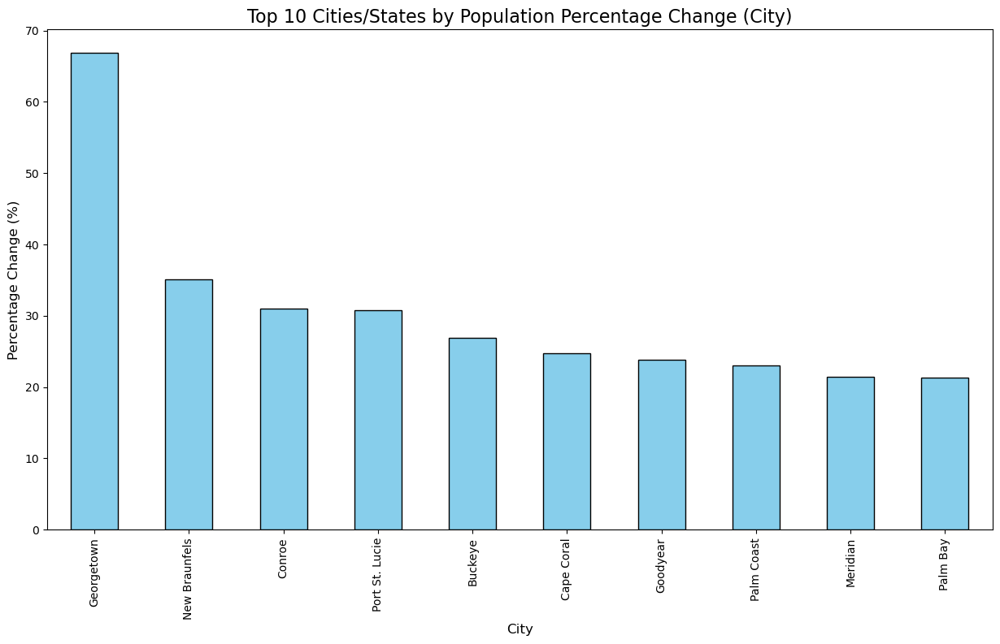

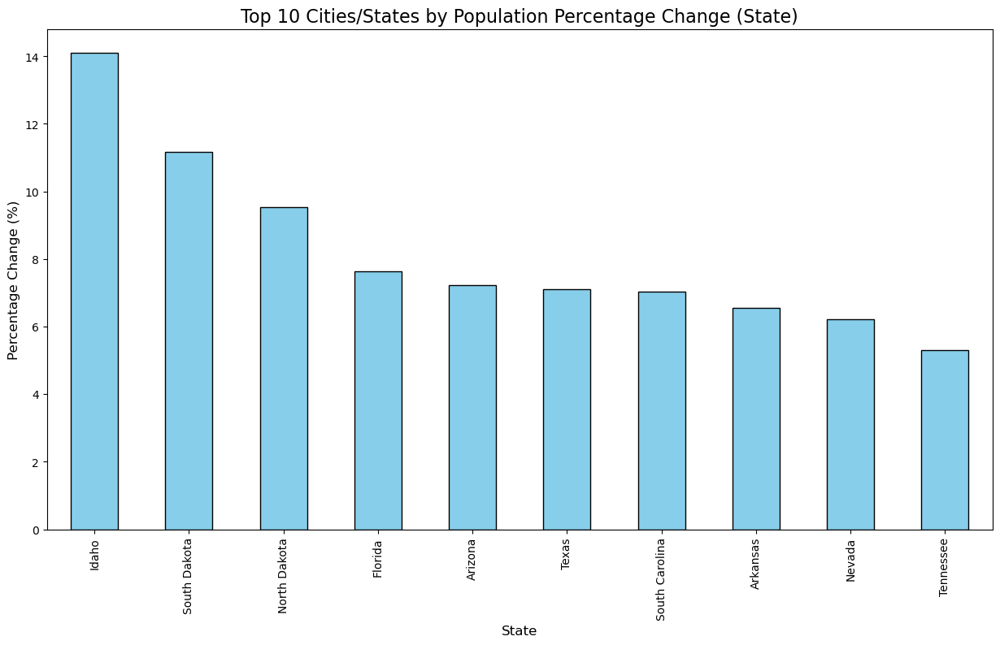

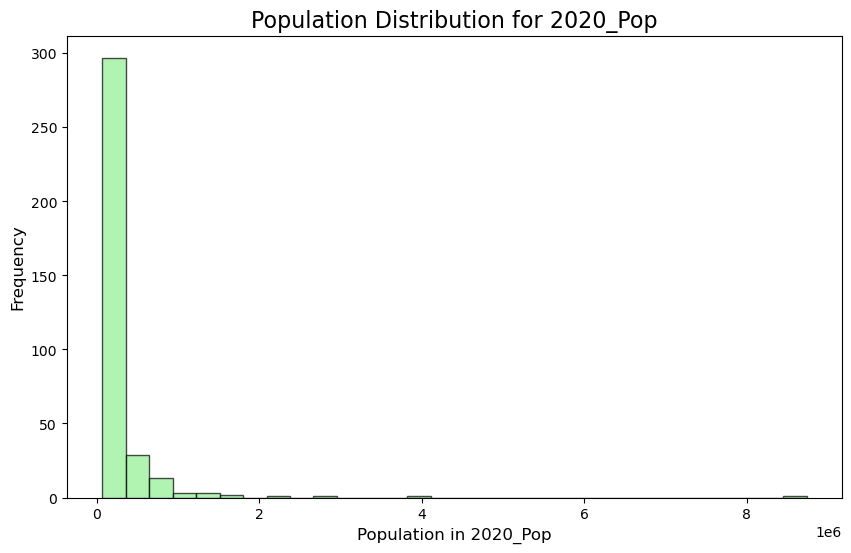

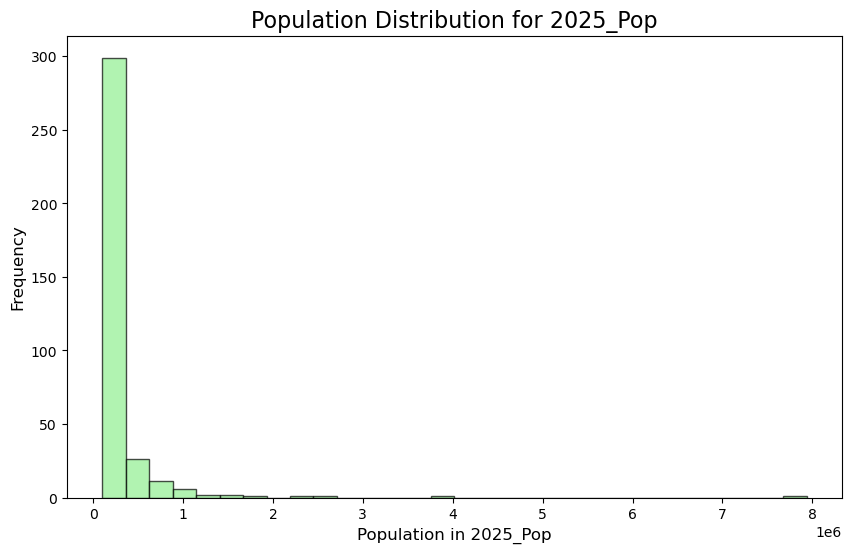

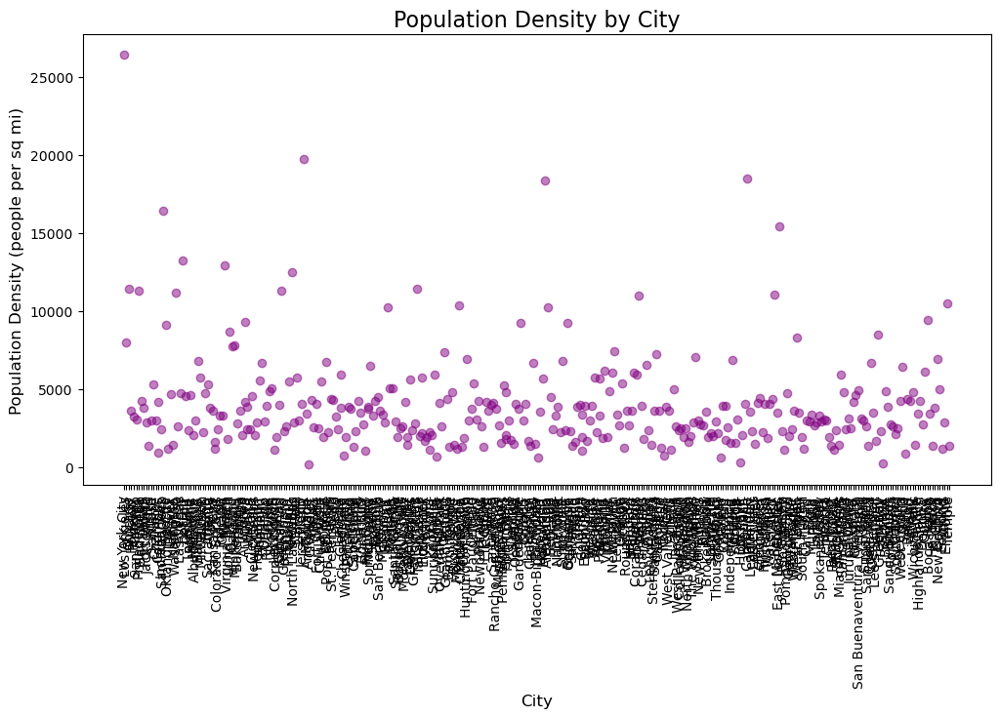

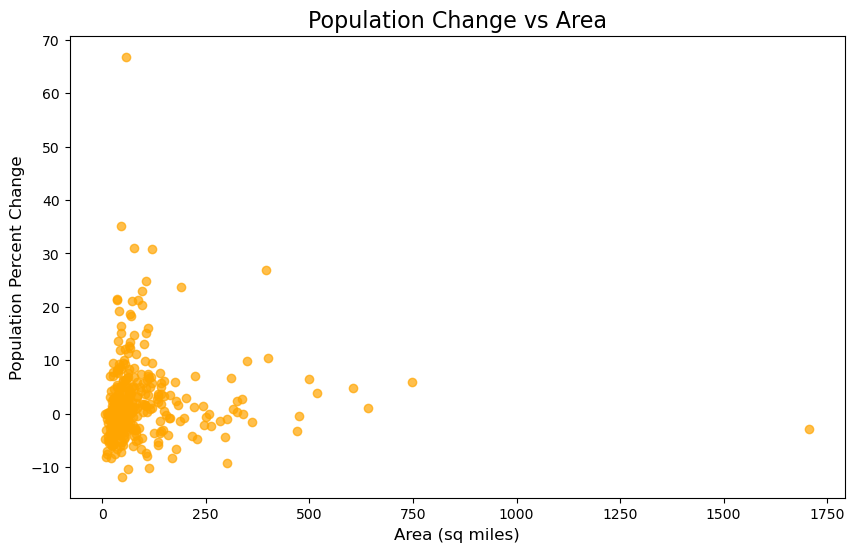

In [39]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset with proper handling
file_path = "us_city_population.csv"
population_df = pd.read_csv(file_path)

# Rename corrupted column names
population_df.columns = ["City", "Rank", "State", "2025_Pop", "2020_Pop", "Change", "Density", "Area_sq_mi", "Type"]

# Drop rows where City or State is missing
population_df = population_df.dropna(subset=["City", "State"])

# Convert numeric columns correctly (removing commas where necessary)
for col in ["2025_Pop", "2020_Pop", "Change", "Density", "Area_sq_mi"]:
    population_df[col] = pd.to_numeric(population_df[col].astype(str).str.replace(",", ""), errors="coerce")

# Calculate percentage change in population (2025 vs 2020)
population_df["Percent_Change"] = ((population_df["2025_Pop"] - population_df["2020_Pop"]) / population_df["2020_Pop"]) * 100

# ✅ Function to summarize dataset
def summarize_data(df):
    print("\nSummary Statistics:\n", df.describe())
    print("\nMissing Values:\n", df.isnull().sum())
    print("\nMode Values:\n", df.mode().iloc[0])

summarize_data(population_df)

# ✅ Function to visualize percentage change in population across cities or states
def plot_percentage_change(df, by="City"):
    # Calculate average percent change by the chosen grouping (default: City)
    if by == "State":
        avg_change = df.groupby("State")["Percent_Change"].mean().sort_values(ascending=False)
    else:
        avg_change = df.groupby("City")["Percent_Change"].mean().sort_values(ascending=False)

    # Plotting
    plt.figure(figsize=(15, 8))
    avg_change.head(10).plot(kind='bar', color='skyblue', edgecolor='black')  # Top 10 cities or states
    plt.title(f"Top 10 Cities/States by Population Percentage Change ({by})", fontsize=16)
    plt.xlabel(by, fontsize=12)
    plt.ylabel("Percentage Change (%)", fontsize=12)
    plt.xticks(rotation=90)
    plt.show()

# Plot percentage change for the top 10 cities
plot_percentage_change(population_df, by="City")

# Plot percentage change for the top 10 states
plot_percentage_change(population_df, by="State")

# ✅ Population Distribution (Histogram)
def plot_population_distribution(df, year="2025_Pop"):
    plt.figure(figsize=(10, 6))
    plt.hist(df[year].dropna(), bins=30, edgecolor='black', alpha=0.7, color='lightgreen')
    plt.title(f"Population Distribution for {year}", fontsize=16)
    plt.xlabel(f"Population in {year}", fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.show()

# Plot distribution for 2020 and 2025 populations
plot_population_distribution(population_df, year="2020_Pop")
plot_population_distribution(population_df, year="2025_Pop")

# ✅ Population Density by City (Scatter Plot)
def plot_population_density(df):
    plt.figure(figsize=(12, 6))
    plt.scatter(df["City"], df["Density"], alpha=0.5, color='purple')
    plt.title("Population Density by City", fontsize=16)
    plt.xlabel("City", fontsize=12)
    plt.ylabel("Population Density (people per sq mi)", fontsize=12)
    plt.xticks(rotation=90)
    plt.show()

# Plot population density by city
plot_population_density(population_df)

# ✅ Population Change vs Area (Scatter Plot)
def plot_population_change_vs_area(df):
    plt.figure(figsize=(10, 6))
    plt.scatter(df["Area_sq_mi"], df["Percent_Change"], alpha=0.7, color='orange')
    plt.title("Population Change vs Area", fontsize=16)
    plt.xlabel("Area (sq miles)", fontsize=12)
    plt.ylabel("Population Percent Change", fontsize=12)
    plt.show()

# Plot population change vs area
plot_population_change_vs_area(population_df)


📄 Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84548 entries, 0 to 84547
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   Unnamed: 0                      84548 non-null  int64 
 1   BOROUGH                         84548 non-null  int64 
 2   NEIGHBORHOOD                    84548 non-null  object
 3   BUILDING CLASS CATEGORY         84548 non-null  object
 4   TAX CLASS AT PRESENT            84548 non-null  object
 5   BLOCK                           84548 non-null  int64 
 6   LOT                             84548 non-null  int64 
 7   EASE-MENT                       84548 non-null  object
 8   BUILDING CLASS AT PRESENT       84548 non-null  object
 9   ADDRESS                         84548 non-null  object
 10  APARTMENT NUMBER                84548 non-null  object
 11  ZIP CODE                        84548 non-null  int64 
 12  RESIDENTIAL UNITS             

C:\Users\firas\AppData\Local\Temp\ipykernel_21444\2972126329.py:28: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  plt.tight_layout()
c:\Users\firas\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


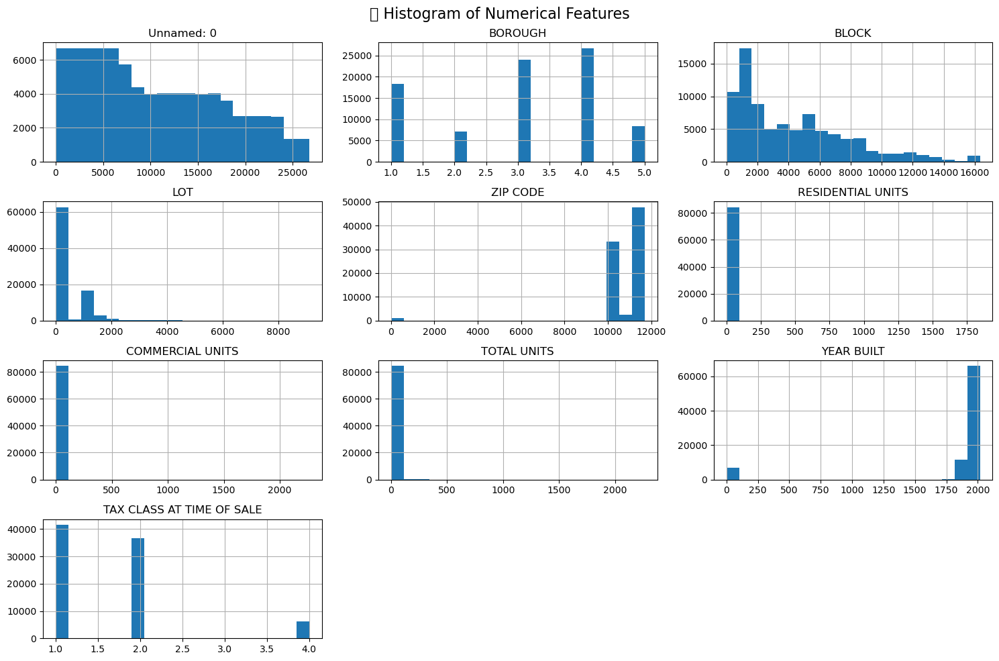

c:\Users\firas\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


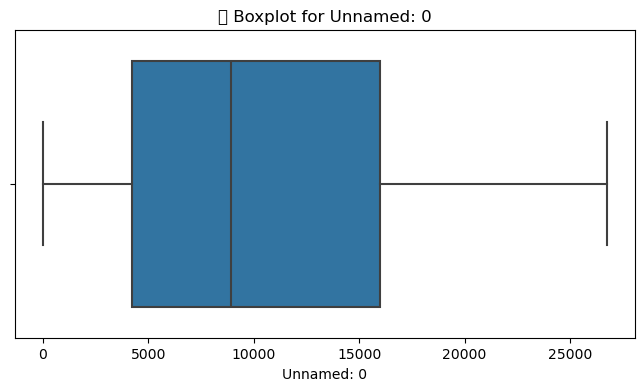

c:\Users\firas\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


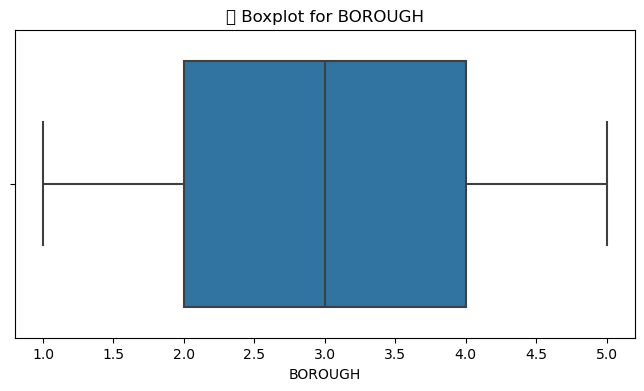

c:\Users\firas\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


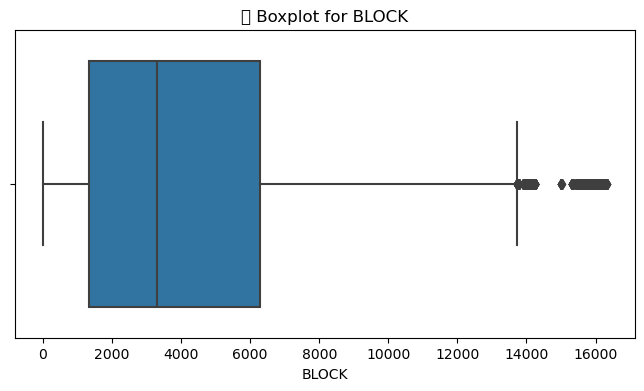

c:\Users\firas\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


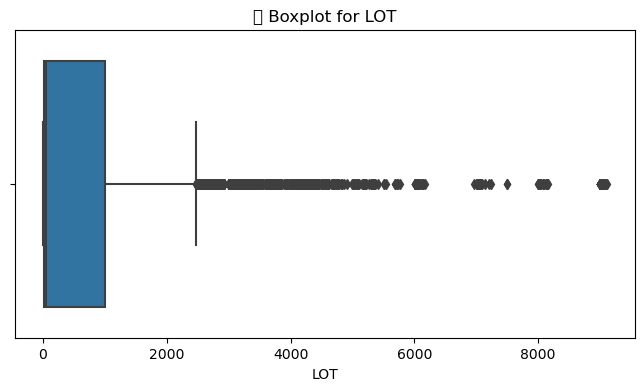

c:\Users\firas\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


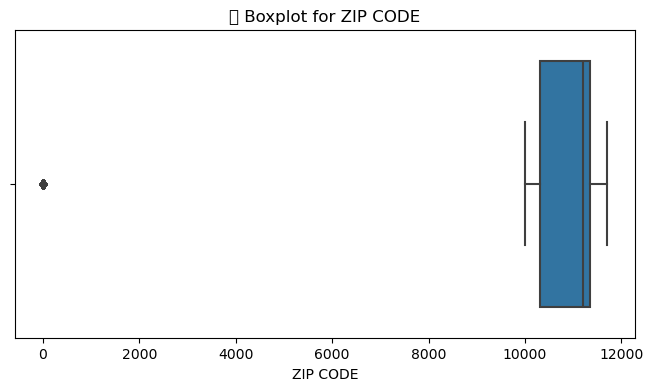

c:\Users\firas\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


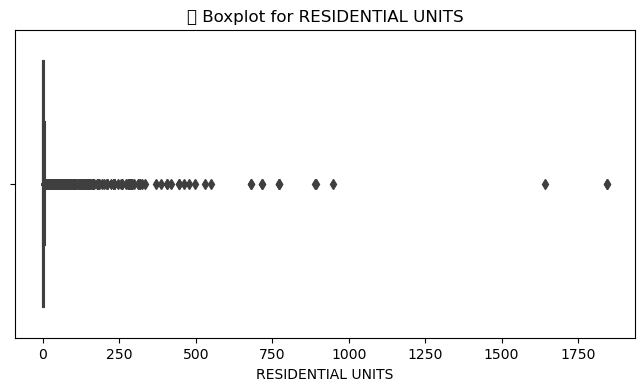

c:\Users\firas\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


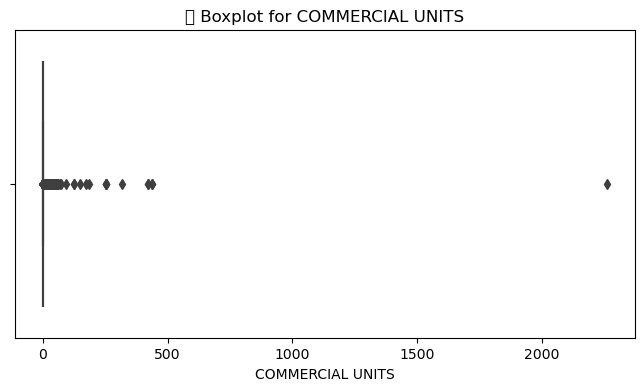

c:\Users\firas\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


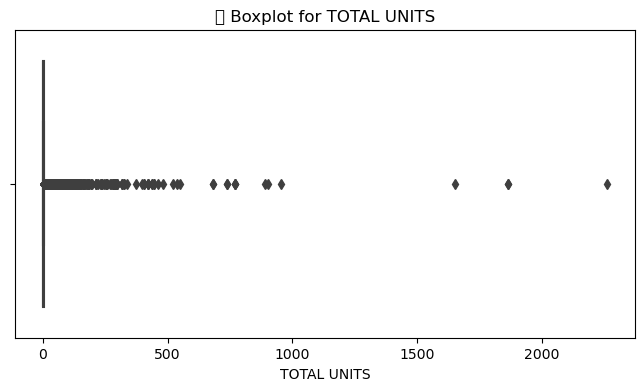

c:\Users\firas\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


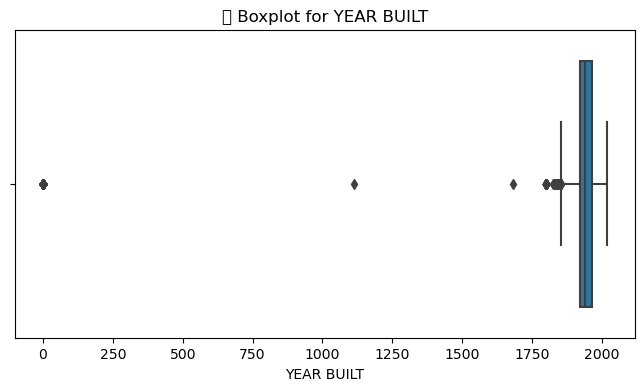

c:\Users\firas\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


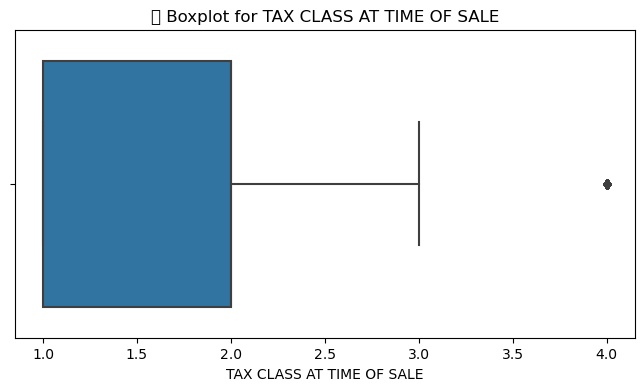

c:\Users\firas\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 127961 (\N{CITYSCAPE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


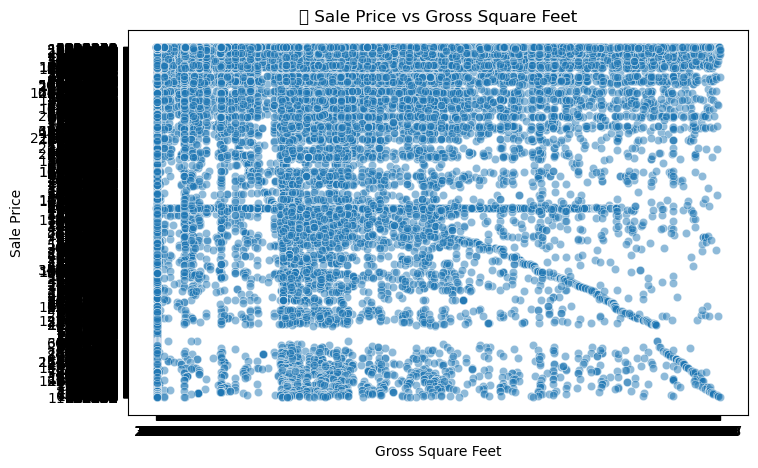

In [40]:
#]cleaning and analysing nyc dataset
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
nycdf = pd.read_csv(r"C:\Users\firas\OneDrive\Documents\University study\year 2 semester 2\data science 2\nyc-rolling-sales.csv")

# Display basic info
print("📄 Dataset Info:")
print(nycdf.info())

# Summary statistics
print("\n📊 Summary Statistics:")
print(nycdf.describe(include='all'))

# Check for missing values
print("\n🧩 Missing Values:")
print(nycdf.isnull().sum())

# Check for duplicates
print("\n🗃️ Duplicate Rows:", nycdf.duplicated().sum())

# Histograms for numerical columns
numerical_cols = nycdf.select_dtypes(include=['float64', 'int64']).columns
nycdf[numerical_cols].hist(bins=20, figsize=(15, 10))
plt.suptitle("📊 Histogram of Numerical Features", fontsize=16)
plt.tight_layout()
plt.show()

# Box plots for outlier detection
for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=nycdf[col])
    plt.title(f"📦 Boxplot for {col}")
    plt.show()

# Scatter plot example: Sale Price vs Gross Square Feet (if available)
if "SALE PRICE" in nycdf.columns and "GROSS SQUARE FEET" in nycdf.columns:
    plt.figure(figsize=(8, 5))
    sns.scatterplot(
        x=nycdf["GROSS SQUARE FEET"],
        y=nycdf["SALE PRICE"],
        alpha=0.5
    )
    plt.title("🏙️ Sale Price vs Gross Square Feet")
    plt.xlabel("Gross Square Feet")
    plt.ylabel("Sale Price")
    plt.show()
else:
    print("🚫 Columns for scatter plot not found.")


## Preprocessing and Feature Engineering
- Handle missing values.
- Remove duplicates and outliers.
- Apply transformations (scaling, encoding, feature interactions).


Summary Statistics:
              Rank    2025_Pop    2020_Pop     Density  Area_sq_mi
count  279.000000  279.000000  279.000000  279.000000  279.000000
mean   199.767025    0.212480    0.265144    0.378384    0.260980
std     88.218415    0.224144    0.200841    0.218069    0.204848
min     45.000000    0.000000    0.000000    0.000000    0.000000
25%    124.500000    0.045234    0.121267    0.210530    0.115280
50%    202.000000    0.125312    0.191363    0.329289    0.201091
75%    276.000000    0.312149    0.348762    0.495676    0.344720
max    351.000000    1.000000    1.000000    1.000000    1.000000

Missing Values:
 City          0
Rank          0
State         0
2025_Pop      0
2020_Pop      0
Density       0
Area_sq_mi    0
Type          0
dtype: int64

Mode Values:
 City            Columbia
Rank                  45
State         California
2025_Pop        0.033926
2020_Pop             0.0
Density         0.179777
Area_sq_mi      0.049168
Type                City
Name: 0, d

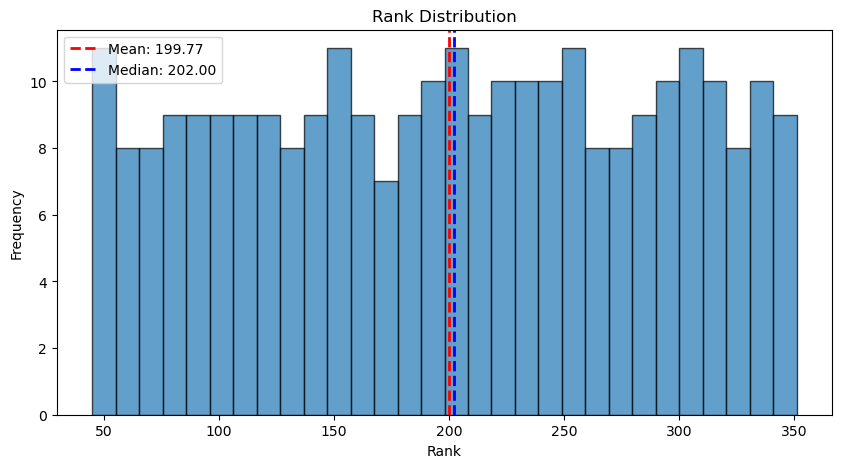

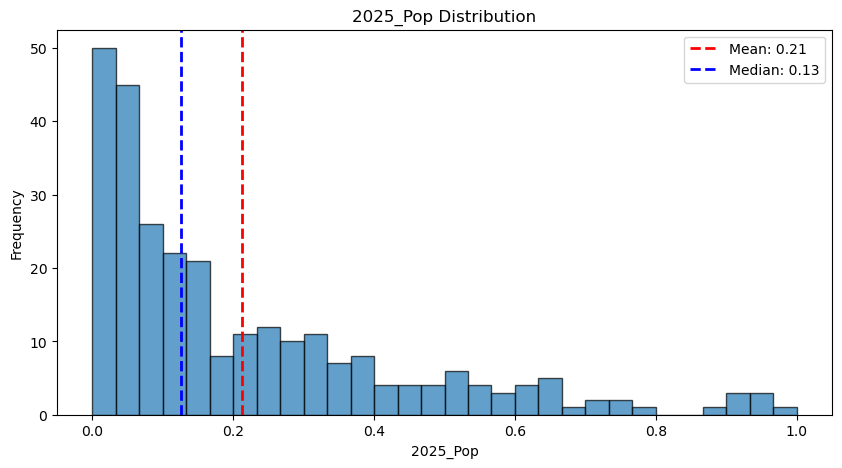

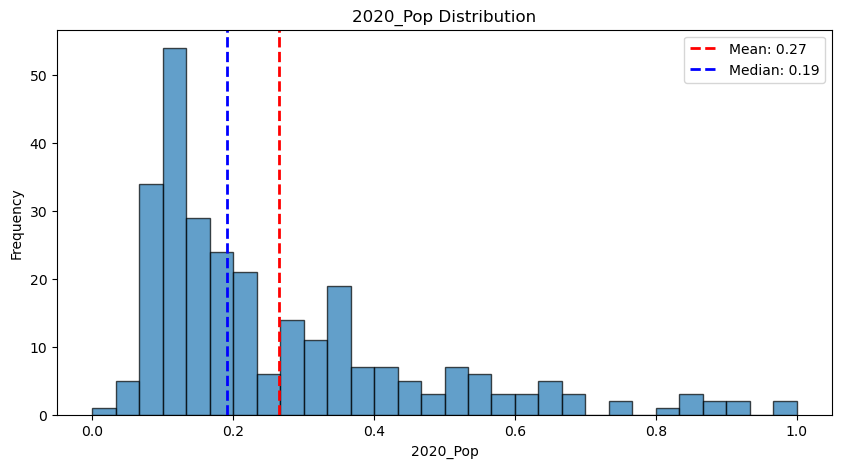

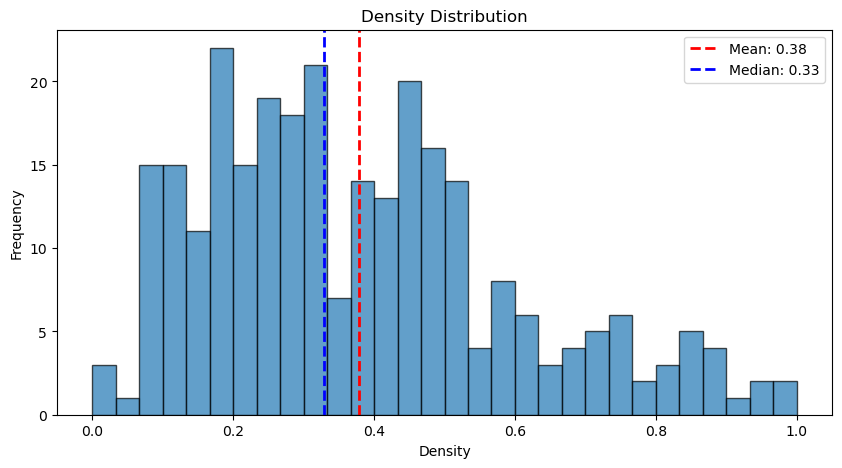

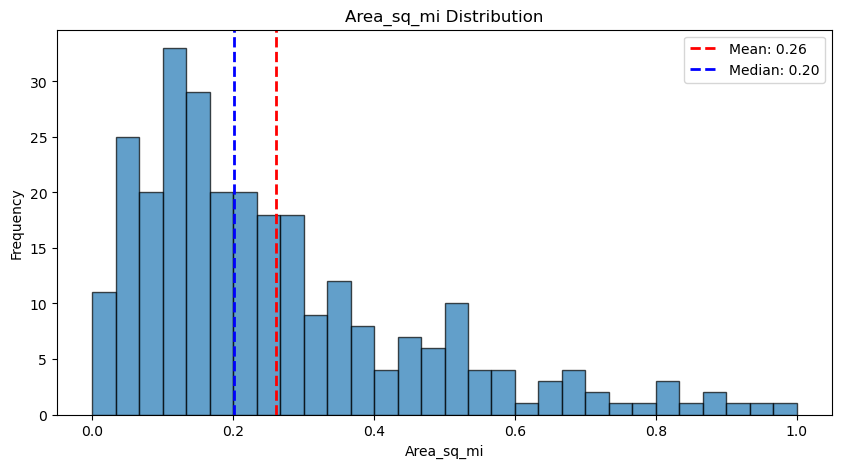

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Load dataset with proper handling
file_path = "us_city_population.csv"
population_df = pd.read_csv(file_path)

# ✅ Rename corrupted column names
population_df.columns = ["City", "Rank", "State", "2025_Pop", "2020_Pop", "Change", "Density", "Area_sq_mi", "Type"]

# ✅ Drop rows where City or State is missing
population_df = population_df.dropna(subset=["City", "State"])

# ✅ Convert numeric columns correctly (removing commas where necessary)
for col in ["2025_Pop", "2020_Pop", "Change", "Density", "Area_sq_mi"]:
    population_df[col] = pd.to_numeric(population_df[col].astype(str).str.replace(",", ""), errors="coerce")

# ✅ Handle missing values by filling with median values (except 'Change' which is completely missing)
population_df.drop(columns=["Change"], inplace=True)
population_df.fillna(population_df.median(numeric_only=True), inplace=True)

# ✅ Remove duplicate entries
population_df.drop_duplicates(inplace=True)

# ✅ Remove outliers using the IQR method
def remove_outliers(df, columns):
    Q1 = df[columns].quantile(0.25)
    Q3 = df[columns].quantile(0.75)
    IQR = Q3 - Q1
    return df[~((df[columns] < (Q1 - 1.5 * IQR)) | (df[columns] > (Q3 + 1.5 * IQR))).any(axis=1)]

population_df = remove_outliers(population_df, ["2025_Pop", "2020_Pop", "Density", "Area_sq_mi"])

# ✅ Scale numeric features using MinMaxScaler
scaler = MinMaxScaler()
population_df[["2025_Pop", "2020_Pop", "Density", "Area_sq_mi"]] = scaler.fit_transform(
    population_df[["2025_Pop", "2020_Pop", "Density", "Area_sq_mi"]]
)

# ✅ Function to summarize dataset
def summarize_data(df):
    print("\nSummary Statistics:\n", df.describe())
    print("\nMissing Values:\n", df.isnull().sum())
    print("\nMode Values:\n", df.mode().iloc[0])

summarize_data(population_df)

# ✅ Function to visualize distributions
def plot_data(df, col_name):
    plt.figure(figsize=(10, 5))
    plt.hist(df[col_name].dropna(), bins=30, edgecolor='black', alpha=0.7)
    plt.axvline(df[col_name].mean(), color='red', linestyle='dashed', linewidth=2, label=f"Mean: {df[col_name].mean():.2f}")
    plt.axvline(df[col_name].median(), color='blue', linestyle='dashed', linewidth=2, label=f"Median: {df[col_name].median():.2f}")
    plt.legend()
    plt.title(f"{col_name} Distribution")
    plt.xlabel(col_name)
    plt.ylabel("Frequency")
    plt.show()

# ✅ Plot cleaned data
for col in population_df.select_dtypes(include=["number"]).columns:
    plot_data(population_df, col)

In [42]:
#cleaning for nyc dataset
# Convert relevant columns to numeric (remove commas, replace missing dashes)

cols_to_convert = ['LAND SQUARE FEET', 'GROSS SQUARE FEET', 'SALE PRICE']
for col in cols_to_convert:
    nycdf[col] = nycdf[col].replace('-', '0')
    nycdf[col] = nycdf[col].str.replace(',', '')
    nycdf[col] = pd.to_numeric(nycdf[col], errors='coerce')

# Fix YEAR BUILT where it's 0
nycdf['YEAR BUILT'] = nycdf['YEAR BUILT'].replace(0, pd.NA)

# Drop the EASE-MENT column if it's just one value
if nycdf['EASE-MENT'].nunique() == 1:
    nycdf.drop(columns='EASE-MENT', inplace=True)

# Confirm the changes
print(nycdf[cols_to_convert].dtypes)
print("YEAR BUILT Nulls:", nycdf['YEAR BUILT'].isnull().sum())


LAND SQUARE FEET     float64
GROSS SQUARE FEET    float64
SALE PRICE           float64
dtype: object
YEAR BUILT Nulls: 6970


# Milestone 2: Advanced Data Analysis and Feature Engineering

## Statistical Analysis
- Conduct tests such as t-tests, ANOVA, and chi-squared to explore relationships.


Summary Statistics:
              Rank    2025_Pop    2020_Pop     Density  Area_sq_mi
count  279.000000  279.000000  279.000000  279.000000  279.000000
mean   199.767025    0.212480    0.265144    0.378384    0.260980
std     88.218415    0.224144    0.200841    0.218069    0.204848
min     45.000000    0.000000    0.000000    0.000000    0.000000
25%    124.500000    0.045234    0.121267    0.210530    0.115280
50%    202.000000    0.125312    0.191363    0.329289    0.201091
75%    276.000000    0.312149    0.348762    0.495676    0.344720
max    351.000000    1.000000    1.000000    1.000000    1.000000

Missing Values:
 City          0
Rank          0
State         0
2025_Pop      0
2020_Pop      0
Density       0
Area_sq_mi    0
Type          0
dtype: int64

Mode Values:
 City            Columbia
Rank                  45
State         California
2025_Pop        0.033926
2020_Pop             0.0
Density         0.179777
Area_sq_mi      0.049168
Type                City
Name: 0, d

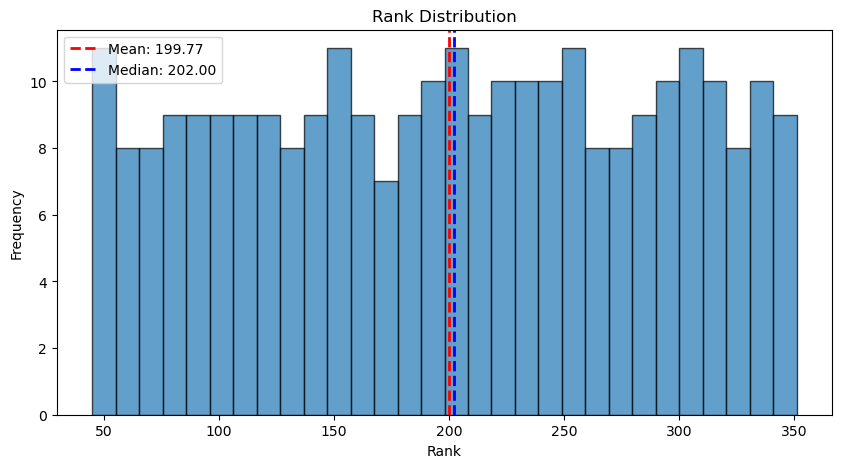

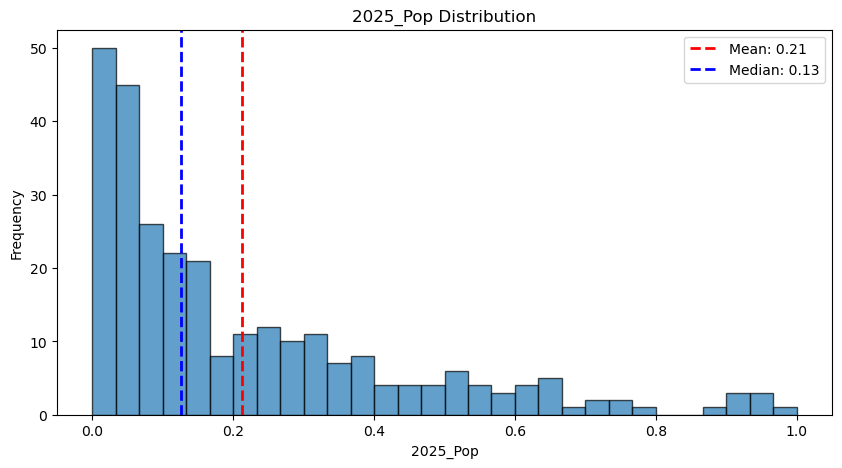

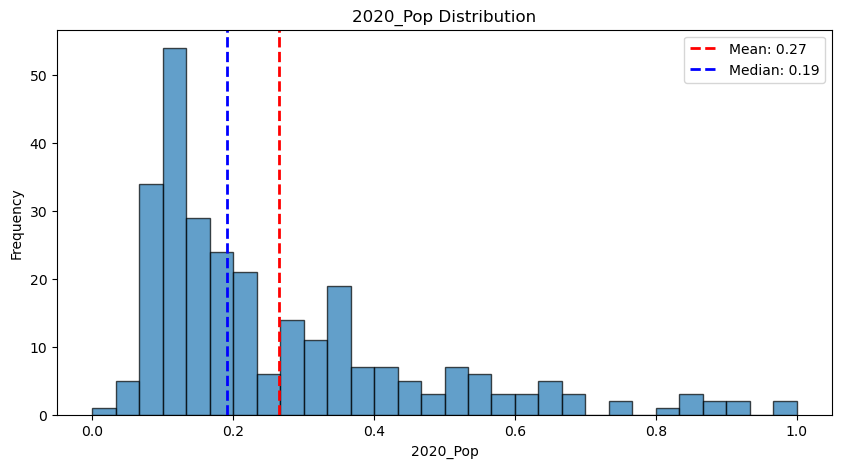

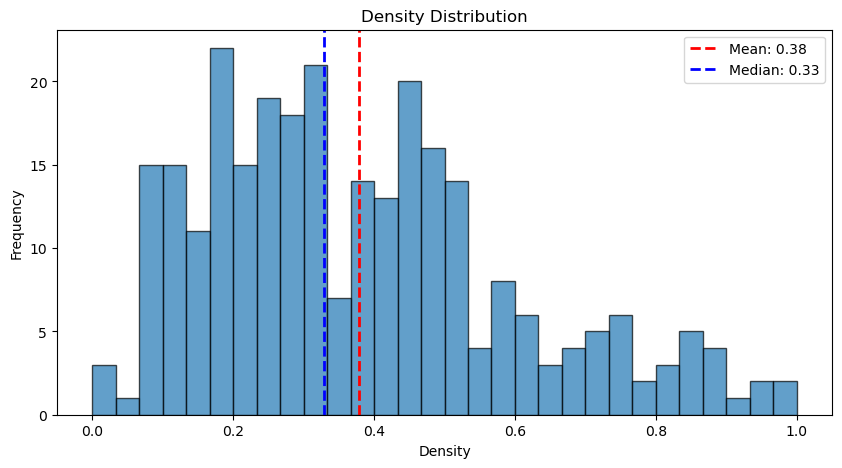

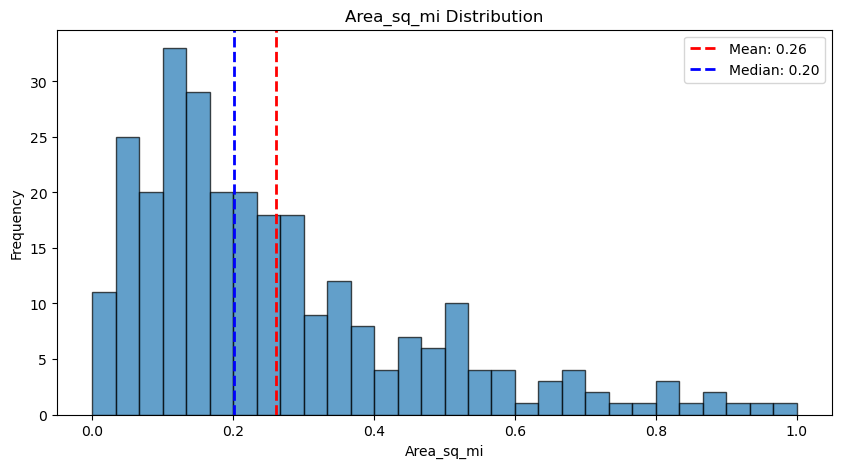


T-Test between 2025 and 2020 Population:
T-Statistic: -22.280192495077454, P-Value: 8.525665514136127e-64

ANOVA Test across States:
ANOVA Statistic: 1.5668825664089088, P-Value: 0.07544510249555075

Chi-Squared Test for City Type and Rank:
Chi-Squared Statistic: 837.0, P-Value: 0.46426801989670086


In [43]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from scipy import stats
import seaborn as sns

# Load dataset with proper handling
file_path = "us_city_population.csv"
population_df = pd.read_csv(file_path)

# ✅ Rename corrupted column names
population_df.columns = ["City", "Rank", "State", "2025_Pop", "2020_Pop", "Change", "Density", "Area_sq_mi", "Type"]

# ✅ Drop rows where City or State is missing
population_df = population_df.dropna(subset=["City", "State"])

# ✅ Convert numeric columns correctly (removing commas where necessary)
for col in ["2025_Pop", "2020_Pop", "Change", "Density", "Area_sq_mi"]:
    population_df[col] = pd.to_numeric(population_df[col].astype(str).str.replace(",", ""), errors="coerce")

# ✅ Handle missing values by filling with median values (except 'Change' which is completely missing)
population_df.drop(columns=["Change"], inplace=True)
population_df.fillna(population_df.median(numeric_only=True), inplace=True)

# ✅ Remove duplicate entries
population_df.drop_duplicates(inplace=True)

# ✅ Remove outliers using the IQR method
def remove_outliers(df, columns):
    Q1 = df[columns].quantile(0.25)
    Q3 = df[columns].quantile(0.75)
    IQR = Q3 - Q1
    return df[~((df[columns] < (Q1 - 1.5 * IQR)) | (df[columns] > (Q3 + 1.5 * IQR))).any(axis=1)]

population_df = remove_outliers(population_df, ["2025_Pop", "2020_Pop", "Density", "Area_sq_mi"])

# ✅ Scale numeric features using MinMaxScaler
scaler = MinMaxScaler()
population_df[["2025_Pop", "2020_Pop", "Density", "Area_sq_mi"]] = scaler.fit_transform(
    population_df[["2025_Pop", "2020_Pop", "Density", "Area_sq_mi"]]
)

# ✅ Function to summarize dataset
def summarize_data(df):
    print("\nSummary Statistics:\n", df.describe())
    print("\nMissing Values:\n", df.isnull().sum())
    print("\nMode Values:\n", df.mode().iloc[0])

summarize_data(population_df)

# ✅ Function to visualize distributions
def plot_data(df, col_name):
    plt.figure(figsize=(10, 5))
    plt.hist(df[col_name].dropna(), bins=30, edgecolor='black', alpha=0.7)
    plt.axvline(df[col_name].mean(), color='red', linestyle='dashed', linewidth=2, label=f"Mean: {df[col_name].mean():.2f}")
    plt.axvline(df[col_name].median(), color='blue', linestyle='dashed', linewidth=2, label=f"Median: {df[col_name].median():.2f}")
    plt.legend()
    plt.title(f"{col_name} Distribution")
    plt.xlabel(col_name)
    plt.ylabel("Frequency")
    plt.show()

# ✅ Plot cleaned data
for col in population_df.select_dtypes(include=["number"]).columns:
    plot_data(population_df, col)

# ✅ Conduct statistical tests
# T-Test: Compare 2025 Population vs 2020 Population
print("\nT-Test between 2025 and 2020 Population:")
t_stat, p_value = stats.ttest_rel(population_df["2025_Pop"], population_df["2020_Pop"])
print(f"T-Statistic: {t_stat}, P-Value: {p_value}")

# ANOVA Test: Comparing population differences by state (for states with at least 5 cities)
state_counts = population_df["State"].value_counts()
valid_states = state_counts[state_counts >= 5].index
anova_df = population_df[population_df["State"].isin(valid_states)]

anova_groups = [group["2025_Pop"].values for name, group in anova_df.groupby("State")]
print("\nANOVA Test across States:")
anova_stat, anova_p = stats.f_oneway(*anova_groups)
print(f"ANOVA Statistic: {anova_stat}, P-Value: {anova_p}")

# Chi-Squared Test: Checking association between city type and rank
contingency_table = pd.crosstab(population_df["Type"], population_df["Rank"])
print("\nChi-Squared Test for City Type and Rank:")
chi2_stat, chi2_p, dof, expected = stats.chi2_contingency(contingency_table)
print(f"Chi-Squared Statistic: {chi2_stat}, P-Value: {chi2_p}")



In [44]:
#tests for nyc dataset
import pandas as pd
from scipy import stats
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

file_path = "us_city_population.csv"
population_df = pd.read_csv(file_path)

#t-test for nyc dataset
# Boroughs: 1 = Manhattan, 3 = Brooklyn
manhattan = nycdf[(nycdf['BOROUGH'] == 1) & (nycdf['SALE PRICE'] > 0)]['SALE PRICE']
brooklyn = nycdf[(nycdf['BOROUGH'] == 3) & (nycdf['SALE PRICE'] > 0)]['SALE PRICE']

t_stat, p_val = stats.ttest_ind(manhattan, brooklyn, equal_var=False)
print(f"T-test: t-statistic = {t_stat:.3f}, p-value = {p_val:.5f}")
#ANOVA for nyc dataset
boroughs = nycdf[nycdf['SALE PRICE'] > 0].groupby('BOROUGH')['SALE PRICE'].apply(list)

anova_result = stats.f_oneway(*boroughs)
print(f"ANOVA: F-statistic = {anova_result.statistic:.3f}, p-value = {anova_result.pvalue:.5f}")
#chi-square test for nyc dataset
contingency = pd.crosstab(nycdf['TAX CLASS AT TIME OF SALE'], nycdf['BUILDING CLASS AT TIME OF SALE'])
chi2, p, dof, expected = stats.chi2_contingency(contingency)

print(f"Chi-squared test:\nChi2 = {chi2:.3f}, p-value = {p:.5f}, Degrees of freedom = {dof}")



T-test: t-statistic = 10.084, p-value = 0.00000
ANOVA: F-statistic = 113.011, p-value = 0.00000
Chi-squared test:
Chi2 = 253644.000, p-value = 0.00000, Degrees of freedom = 495


## Feature Engineering
- Create derived features based on domain knowledge.
- Apply transformations such as normalization, log scaling, or polynomial features.

In [45]:
import numpy as np
import pandas as pd

# Load dataset
population_df = pd.read_csv(r"C:\Users\firas\OneDrive\Documents\University study\year 2 semester 2\Data science 2\us_city_population.csv")

# Clean column names
population_df.columns = population_df.columns.str.strip().str.upper().str.replace(' ', '_')

# Log transform population and density to reduce skewness
population_df['LOG_POPULATION'] = np.log1p(population_df['2025_POPULATION'])
population_df['LOG_DENSITY'] = np.log1p(population_df['DENSITY_(SQ_MI)'])

# People per square mile (already implied by density), or we can do this per square km
# 1 square mile = 2.58999 square kilometers
population_df['DENSITY_SQKM'] = population_df['DENSITY_(SQ_MI)'] * 2.58999

# Categorize cities into density tiers
population_df['DENSITY_CATEGORY'] = pd.qcut(population_df['DENSITY_(SQ_MI)'], q=3, labels=['Low', 'Medium', 'High'])

# Compute population change from 2020 to 2025 (already present as % change, but let’s recalculate)
population_df['POP_CHANGE'] = (population_df['2025_POPULATION'] - population_df['2020_POPULATION']) / population_df['2020_POPULATION'] * 100

# Binary flag for high-growth cities (top 25%)
population_df['HIGH_GROWTH_CITY'] = population_df['POP_CHANGE'] > population_df['POP_CHANGE'].quantile(0.75)

# Real estate pressure index: growth × density
population_df['REAL_ESTATE_PRESSURE_INDEX'] = population_df['POP_CHANGE'] * population_df['DENSITY_(SQ_MI)']
population_df.head()



,CITY,RANK,STATE,2025_POPULATION,2020_POPULATION,CHANGE_(%),DENSITY_(SQ_MI),AREA_(MI²),TYPE,LOG_POPULATION,LOG_DENSITY,DENSITY_SQKM,DENSITY_CATEGORY,POP_CHANGE,HIGH_GROWTH_CITY,REAL_ESTATE_PRESSURE_INDEX
0,New York City,1,New York,7936530,8740292,-1.98,26415.0,300.46,City,15.886987,10.181725,68414.58585,High,-9.196054,False,-242913.774849
1,Los Angeles,2,California,3770958,3895848,-0.66,8014.0,470.52,City,15.142840,8.989070,20756.17986,High,-3.205721,False,-25690.644502
2,Chicago,3,Illinois,2611867,2743329,-1.00,11468.0,227.75,City,14.775576,9.347403,29702.00532,High,-4.792061,False,-54955.355920
3,Houston,4,Texas,2324082,2299269,0.21,3628.0,640.61,City,14.658836,8.196712,9396.48372,Medium,1.079169,False,3915.225404
4,Phoenix,5,Arizona,1675144,1612459,0.75,3232.0,518.33,City,14.331410,8.081166,8370.84768,Medium,3.887541,False,12564.531563


In [46]:
import numpy as np
import pandas as pd


# 1. Convert land size from square feet to acres (1 acre = 43,560 square feet)
nycdf['LOT_SIZE_ACRES'] = nycdf['LAND SQUARE FEET'] / 43560

# 2. Log-transform sale price and lot size to reduce skewness (handling extreme outliers)
nycdf['LOG_SALE_PRICE'] = np.log1p(nycdf['SALE PRICE'])
nycdf['LOG_LOT_SIZE'] = np.log1p(nycdf['LOT_SIZE_ACRES'])

# 3. Encoding building class into numeric codes
nycdf['BUILDING_CLASS_CODE'] = nycdf['BUILDING CLASS AT TIME OF SALE'].astype('category').cat.codes

# 4. Total square footage (combining land square feet and gross square feet)
nycdf['TOTAL_SQUARE_FEET'] = nycdf['GROSS SQUARE FEET'] + nycdf['LAND SQUARE FEET']

# 5. Calculate the age of the building (based on year of sale)
nycdf['AGE_OF_BUILDING'] = 2023 - nycdf['YEAR BUILT']

# 6. Log-transformed price per year (scaled by the age of the building)
nycdf['LOG_PRICE_PER_YEAR'] = nycdf['LOG_SALE_PRICE'] / (nycdf['AGE_OF_BUILDING'] + 1)

# 7. Log-transformed price per square foot (scaled by the total square footage)
nycdf['LOG_PRICE_PER_SQUARE_FEET'] = nycdf['LOG_SALE_PRICE'] / nycdf['TOTAL_SQUARE_FEET']

# Check the newly created features
print(nycdf[['LOT_SIZE_ACRES', 'LOG_SALE_PRICE', 'LOG_LOT_SIZE', 'BUILDING_CLASS_CODE', 
             'TOTAL_SQUARE_FEET', 'AGE_OF_BUILDING', 'LOG_PRICE_PER_YEAR', 'LOG_PRICE_PER_SQUARE_FEET']].head())


   LOT_SIZE_ACRES  LOG_SALE_PRICE  LOG_LOT_SIZE  BUILDING_CLASS_CODE  \
0        0.037489       15.706361      0.036803                   15   
1        0.105969             NaN      0.100722                   20   
2        0.050781             NaN      0.049533                   20   
3        0.052158       15.185745      0.050843                   17   
4        0.054385       15.894952      0.052957                   15   

   TOTAL_SQUARE_FEET AGE_OF_BUILDING LOG_PRICE_PER_YEAR  \
0             8073.0             123           0.126664   
1            23306.0             123                NaN   
2            10015.0             123                NaN   
3             9066.0             110           0.136809   
4             6984.0             123           0.128185   

   LOG_PRICE_PER_SQUARE_FEET  
0                   0.001946  
1                        NaN  
2                        NaN  
3                   0.001675  
4                   0.002276  


## Data Visualization
- Generate insightful visualizations:
  - Correlation heatmaps, pair plots.
  - Trends and comparisons using bar charts, line charts, and dashboards.

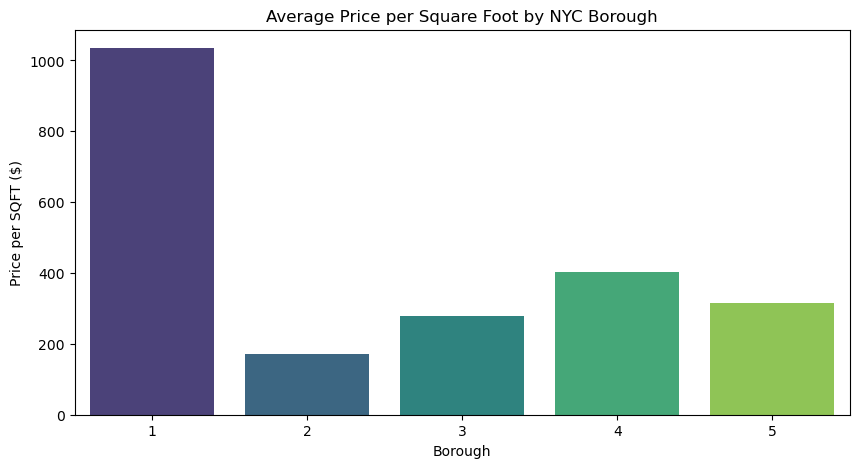

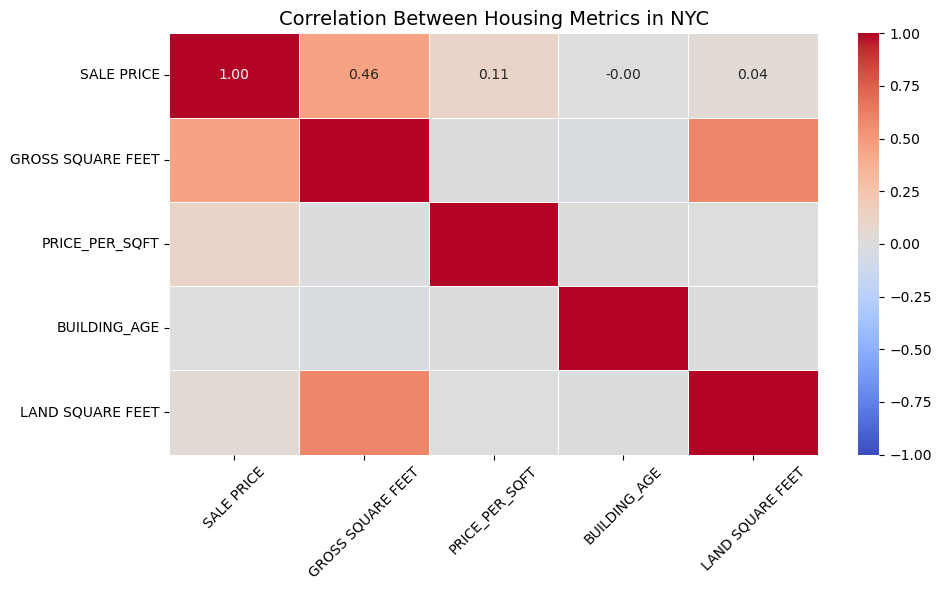

In [47]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load datasets
population_df = pd.read_csv("us_city_population.csv")
nyc_df = pd.read_csv("nyc-rolling-sales.csv")

# Clean NYC data 
nyc_df = nyc_df[nyc_df['SALE PRICE'].apply(lambda x: str(x).replace(',', '').isdigit())].copy()
nyc_df['SALE PRICE'] = nyc_df['SALE PRICE'].astype(float)
nyc_df['GROSS SQUARE FEET'] = pd.to_numeric(nyc_df['GROSS SQUARE FEET'].str.replace(',', ''), errors='coerce')
nyc_df = nyc_df[nyc_df['GROSS SQUARE FEET'] > 0]  # Remove invalid square footage
nyc_df['PRICE_PER_SQFT'] = nyc_df['SALE PRICE'] / nyc_df['GROSS SQUARE FEET']

# Aggregate by borough
borough_prices = nyc_df.groupby('BOROUGH')['PRICE_PER_SQFT'].mean().reset_index()

# Extract NYC population data (New York City is a single row in the population dataset)
nyc_pop = population_df[population_df['City'].str.contains("New York", case=False)].copy()
nyc_pop['POPULATION_CHANGE'] = (nyc_pop['2025 Population'] - nyc_pop['2020 Population']) / nyc_pop['2020 Population']

# Assign the same population data to all boroughs (since NYC is one city)
borough_prices['Density (sq mi)'] = nyc_pop['Density (sq mi)'].values[0]
borough_prices['POPULATION_CHANGE'] = nyc_pop['POPULATION_CHANGE'].values[0]

# Plot 1: Bar Chart of Price per SQFT by Borough
plt.figure(figsize=(10, 5))
sns.barplot(data=borough_prices, x='BOROUGH', y='PRICE_PER_SQFT', palette='viridis')
plt.title("Average Price per Square Foot by NYC Borough")
plt.xlabel("Borough")
plt.ylabel("Price per SQFT ($)")
plt.show()

#plot 2: heat map for nyc dataset

# Load and clean data
nyc_df = pd.read_csv("nyc-rolling-sales.csv")
nyc_df = nyc_df[nyc_df['SALE PRICE'].apply(lambda x: str(x).replace(',', '').isdigit())].copy()
nyc_df['SALE PRICE'] = nyc_df['SALE PRICE'].astype(float)
nyc_df['GROSS SQUARE FEET'] = pd.to_numeric(nyc_df['GROSS SQUARE FEET'].str.replace(',', ''), errors='coerce')
nyc_df['LAND SQUARE FEET'] = pd.to_numeric(nyc_df['LAND SQUARE FEET'].str.replace(',', ''), errors='coerce')

# Calculate key metrics
nyc_df['PRICE_PER_SQFT'] = nyc_df['SALE PRICE'] / nyc_df['GROSS SQUARE FEET']
nyc_df['BUILDING_AGE'] = 2023 - nyc_df['YEAR BUILT']  # Adjust year if needed

# Select numeric columns for correlation
corr_columns = ['SALE PRICE', 'GROSS SQUARE FEET', 'PRICE_PER_SQFT', 'BUILDING_AGE', 'LAND SQUARE FEET']
corr_df = nyc_df[corr_columns].dropna()

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(
    corr_df.corr(), 
    annot=True, 
    cmap='coolwarm', 
    vmin=-1, 
    vmax=1,
    fmt=".2f",
    linewidths=0.5
)
plt.title("Correlation Between Housing Metrics in NYC", fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


---


# Milestone 3: Machine Learning Model Development and Optimization

## Model Selection
- Choose appropriate models for the problem type (classification, regression, clustering, etc.).


In [48]:
from sklearn.linear_model import LinearRegression

# Fit regression
X = nyc_df[['LAND SQUARE FEET']].dropna()
y = nyc_df.loc[X.index, 'SALE PRICE']

model = LinearRegression()
model.fit(X, y)

print(f"Every 1 sqft increase in lot size corresponds to ${model.coef_[0]:.2f} price increase.")

Every 1 sqft increase in lot size corresponds to $19.98 price increase.


 Model Training
- Split data into training, validation, and testing sets.
- Address imbalances using techniques like SMOTE or stratified sampling.

In [49]:
#data preparation
#to answer . Do larger acre lots correspond to significantly higher property prices in different markets?(done)
nyc_df = nyc_df[nyc_df['SALE PRICE'] > 10000]  # Remove outliers
nyc_df = nyc_df[nyc_df['LAND SQUARE FEET'] > 0]  # Valid lot sizes

# Create target variable (classification)
median_price = nyc_df['SALE PRICE'].median()
nyc_df['PRICE_CLASS'] = np.where(nyc_df['SALE PRICE'] >= median_price, 1, 0)  # 1=High, 0=Low

# Select features
X = nyc_df[['LAND SQUARE FEET', 'GROSS SQUARE FEET', 'YEAR BUILT', 'RESIDENTIAL UNITS']]
y = nyc_df['PRICE_CLASS']
# Drop rows with missing values (or impute them)
nyc_df_clean = nyc_df.dropna(subset=['LAND SQUARE FEET', 'GROSS SQUARE FEET', 'YEAR BUILT', 'RESIDENTIAL UNITS'])

# Verify no missing values remain
print(nyc_df_clean[['LAND SQUARE FEET', 'GROSS SQUARE FEET']].isnull().sum())

LAND SQUARE FEET     0
GROSS SQUARE FEET    0
dtype: int64


In [50]:
from sklearn.model_selection import train_test_split
# Check class distribution
print(nyc_df_clean['PRICE_CLASS'].value_counts())

# If severe imbalance (e.g., 90% vs. 10%), use SMOTE
from imblearn.over_sampling import SMOTE

X = nyc_df_clean[['LAND SQUARE FEET', 'GROSS SQUARE FEET', 'YEAR BUILT', 'RESIDENTIAL UNITS']]
y = nyc_df_clean['PRICE_CLASS']

# Split data (stratified to preserve class ratios)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Apply SMOTE only to training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

PRICE_CLASS
1    14595
0    14241
Name: count, dtype: int64


In [51]:
#train model
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score

# Initialize and train
model = RandomForestClassifier(random_state=42)
model.fit(X_train_smote, y_train_smote)

# Evaluate
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))
print(f"ROC AUC: {roc_auc_score(y_test, y_pred):.2f}")

# Feature importance
pd.DataFrame({
    'Feature': X.columns,
    'Importance': model.feature_importances_
}).sort_values('Importance', ascending=False)

              precision    recall  f1-score   support

           0       0.70      0.70      0.70      2849
           1       0.71      0.71      0.71      2919

    accuracy                           0.70      5768
   macro avg       0.70      0.70      0.70      5768
weighted avg       0.70      0.70      0.70      5768

ROC AUC: 0.70


,Feature,Importance
1,GROSS SQUARE FEET,0.478824
0,LAND SQUARE FEET,0.289628
2,YEAR BUILT,0.166730
3,RESIDENTIAL UNITS,0.064818


## Model Evaluation
- Metrics to consider: Accuracy, Precision, Recall, F1-score, RMSE, etc.
- Visual tools: Confusion matrices, ROC curves.

Regression Metrics:
1. Coefficient: $21.19 price increase per sqft
2. R²: 0.004 (1 is perfect)
3. RMSE: $17,192,443.28
4. MAE: $1,912,472.41


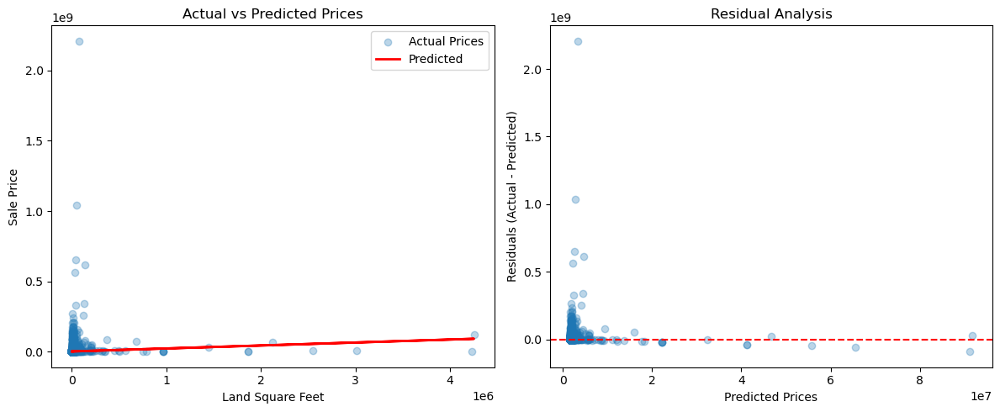

In [52]:
#rf model evaluation
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np
import matplotlib.pyplot as plt

# Fit model (as before)
X = nyc_df[['LAND SQUARE FEET']].dropna()
y = nyc_df.loc[X.index, 'SALE PRICE']
model = LinearRegression()
model.fit(X, y)
nyc_df['LAND SQUARE FEET'].describe()  # Look for max values >> 75th percentile

# Predictions
y_pred = model.predict(X)

# --- Metrics ---
print("Regression Metrics:")
print(f"1. Coefficient: ${model.coef_[0]:.2f} price increase per sqft")
print(f"2. R²: {r2_score(y, y_pred):.3f} (1 is perfect)")
print(f"3. RMSE: ${mean_squared_error(y, y_pred, squared=False):,.2f}")
print(f"4. MAE: ${mean_absolute_error(y, y_pred):,.2f}")

# --- Visualizations ---
plt.figure(figsize=(12, 5))

# 1. Actual vs Predicted
plt.subplot(1, 2, 1)
plt.scatter(X, y, alpha=0.3, label='Actual Prices')
plt.plot(X, y_pred, color='red', linewidth=2, label='Predicted')
plt.xlabel('Land Square Feet')
plt.ylabel('Sale Price')
plt.title('Actual vs Predicted Prices')
plt.legend()

# 2. Residual Plot
plt.subplot(1, 2, 2)
residuals = y - y_pred
plt.scatter(y_pred, residuals, alpha=0.3)
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Prices')
plt.ylabel('Residuals (Actual - Predicted)')
plt.title('Residual Analysis')

plt.tight_layout()
plt.show()

In [53]:
#using Xgboostregressor "GBDT" to answer: What factors (e.g., building class, square footage, number of units) have the most significant impact on sale prices in NYC?.
# to answer: What is the relationship between building age (YEAR BUILT) and property sale prices?
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder

# Prepare data
X = nyc_df[['GROSS SQUARE FEET', 'LAND SQUARE FEET', 'YEAR BUILT', 
            'RESIDENTIAL UNITS', 'BUILDING CLASS CATEGORY']]
y = nyc_df['SALE PRICE']

# Encode categorical features
le = LabelEncoder()
X['BUILDING_CLASS_ENCODED'] = le.fit_transform(X['BUILDING CLASS CATEGORY'])
X = X.drop('BUILDING CLASS CATEGORY', axis=1)

# Train XGBoost regressor
model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
model.fit(X, y)

# Get feature importance
pd.DataFrame({
    'Feature': X.columns,
    'Importance': model.feature_importances_
}).sort_values('Importance', ascending=False)



C:\Users\firas\AppData\Local\Temp\ipykernel_21444\3536769742.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['BUILDING_CLASS_ENCODED'] = le.fit_transform(X['BUILDING CLASS CATEGORY'])


,Feature,Importance
3,RESIDENTIAL UNITS,0.435488
2,YEAR BUILT,0.244523
0,GROSS SQUARE FEET,0.182080
4,BUILDING_CLASS_ENCODED,0.085435
1,LAND SQUARE FEET,0.052474


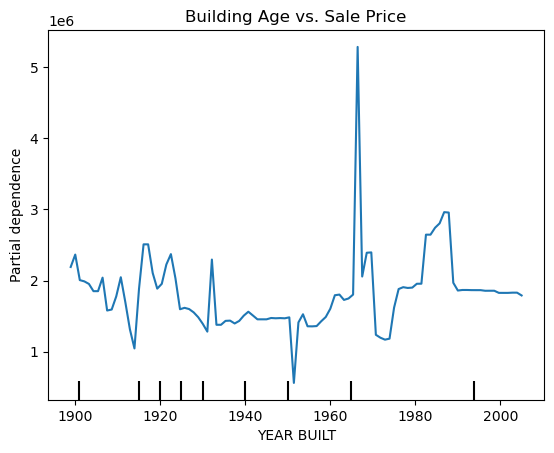

In [54]:
# to answer: What is the relationship between building age (YEAR BUILT) and property sale prices?
from sklearn.inspection import PartialDependenceDisplay

# Train model (as above)
model.fit(X, y)

# Plot relationship
PartialDependenceDisplay.from_estimator(
    model, X, features=['YEAR BUILT'], 
    kind='average', percentiles=(0.05, 0.95)
)
plt.title("Building Age vs. Sale Price")
plt.show()

Test ROC AUC: 0.7718898500148499
              precision    recall  f1-score   support

           0       0.79      0.74      0.76      2912
           1       0.76      0.80      0.78      2960

    accuracy                           0.77      5872
   macro avg       0.77      0.77      0.77      5872
weighted avg       0.77      0.77      0.77      5872



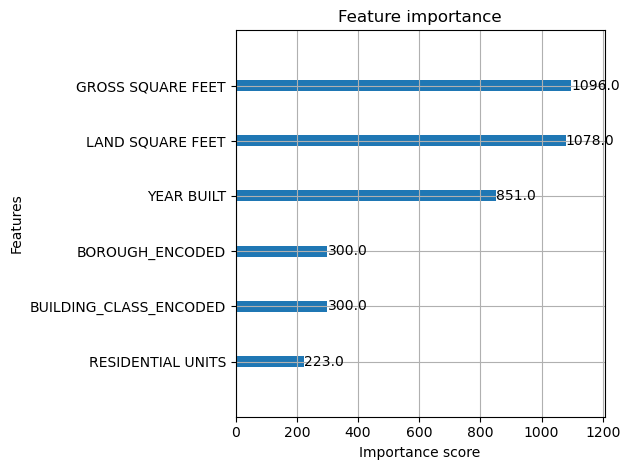

Index(['GROSS SQUARE FEET', 'LAND SQUARE FEET', 'YEAR BUILT',
       'RESIDENTIAL UNITS', 'BUILDING_CLASS_ENCODED', 'BOROUGH_ENCODED'],
      dtype='object')


In [55]:
#trainging gbdt model
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, classification_report
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1. Prepare Data - Create copy to avoid SettingWithCopyWarning
df = nyc_df.copy()

# Convert price to classification (High/Low)
median_price = df['SALE PRICE'].median()
df['PRICE_CLASS'] = np.where(df['SALE PRICE'] >= median_price, 1, 0)

# 2. Preprocessing - Create new DataFrame for features
features = ['GROSS SQUARE FEET', 'LAND SQUARE FEET', 'YEAR BUILT', 
            'RESIDENTIAL UNITS', 'BUILDING CLASS CATEGORY', 'BOROUGH']
X = df[features].copy()
y = df['PRICE_CLASS']

# 3. Encode categorical variables properly
le_building = LabelEncoder()
le_borough = LabelEncoder()

X['BUILDING_CLASS_ENCODED'] = le_building.fit_transform(X['BUILDING CLASS CATEGORY'].astype(str))
X['BOROUGH_ENCODED'] = le_borough.fit_transform(X['BOROUGH'].astype(str))
X = X.drop(['BUILDING CLASS CATEGORY', 'BOROUGH'], axis=1)

# 4. Handle missing values
imputer = SimpleImputer(strategy='median')
X = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

# 5. Train/Validation/Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.25, random_state=42, stratify=y_train
)  # 60/20/20 split

# 6. Handle Imbalance with SMOTE
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# 7. XGBoost Model
model = xgb.XGBClassifier(
    objective='binary:logistic',
    eval_metric='auc',
    random_state=42,
    scale_pos_weight=sum(y_train == 0)/sum(y_train == 1)  # Balance
)

# 8. Train with Early Stopping(xgboost couldn't do it for some reason)
model.fit(X_train_res, y_train_res, verbose=True)



# 9. Evaluate
y_pred = model.predict(X_test)
print("Test ROC AUC:", roc_auc_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

# 10. Feature Importance
xgb.plot_importance(model)
plt.tight_layout()
plt.show()
print(X_train.columns)


=== Classification Report ===
              precision    recall  f1-score   support

   Low Price       0.79      0.74      0.76      2912
  High Price       0.76      0.80      0.78      2960

    accuracy                           0.77      5872
   macro avg       0.77      0.77      0.77      5872
weighted avg       0.77      0.77      0.77      5872


ROC AUC: 0.8537
Average Precision: 0.8439


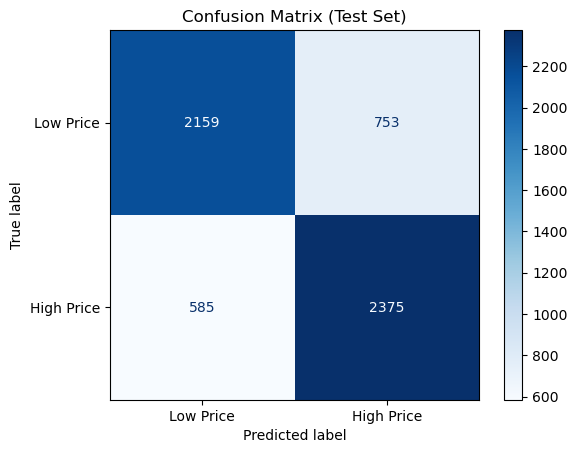

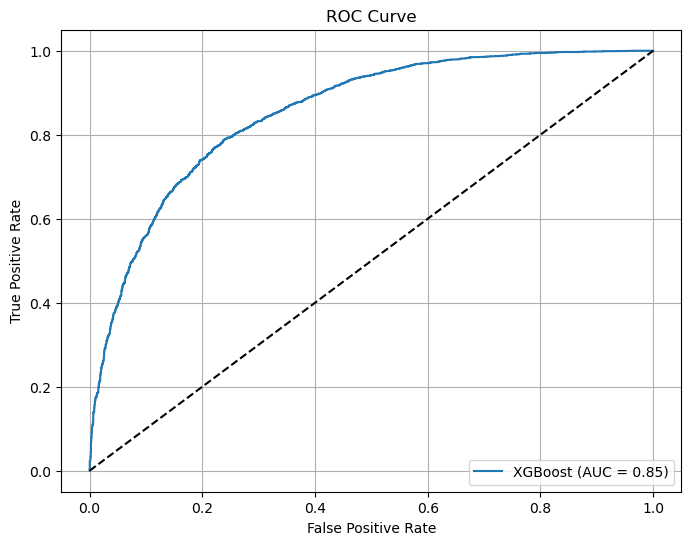

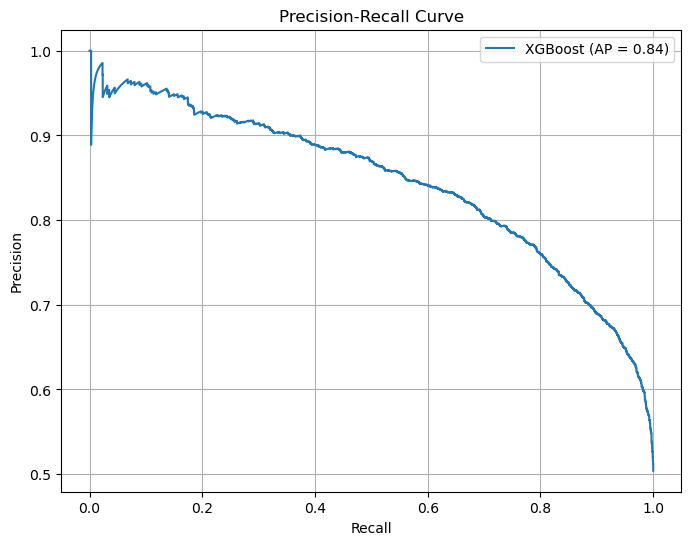

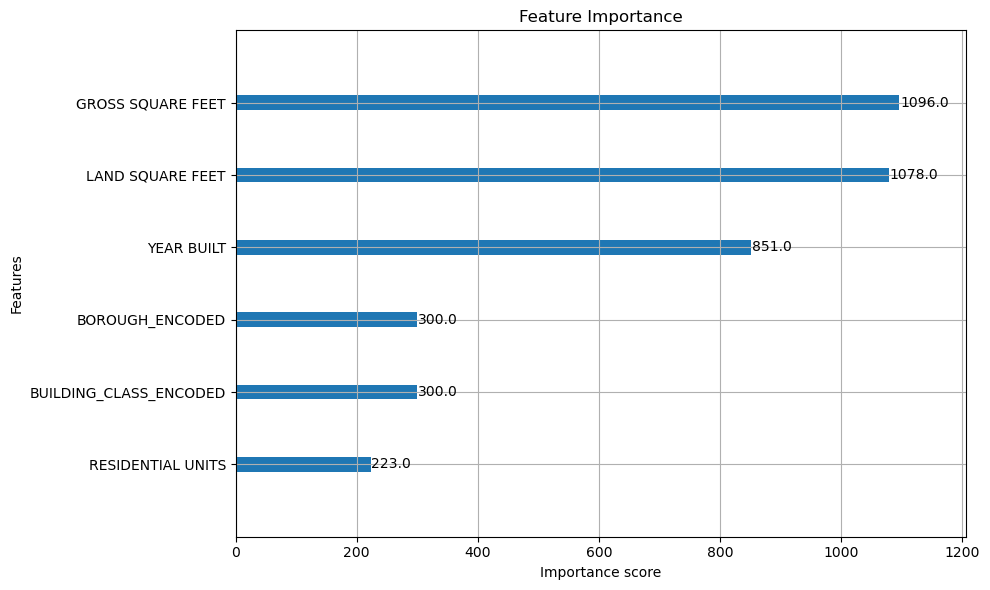

In [56]:
from sklearn.metrics import (roc_auc_score, classification_report, 
                            confusion_matrix, ConfusionMatrixDisplay,
                            precision_recall_curve, average_precision_score)
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt


# 1. Get predicted probabilities (for more detailed analysis)
y_proba = model.predict_proba(X_test)[:, 1]  # Probability of class 1 (High price)

# 2. Print comprehensive metrics
print("=== Classification Report ===")
print(classification_report(y_test, y_pred, target_names=["Low Price", "High Price"]))

print(f"\nROC AUC: {roc_auc_score(y_test, y_proba):.4f}")
print(f"Average Precision: {average_precision_score(y_test, y_proba):.4f}")

# 3. Enhanced Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, 
                            display_labels=["Low Price", "High Price"])
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix (Test Set)")
plt.show()

# 4. ROC Curve with better visualization
fpr, tpr, _ = roc_curve(y_test, y_proba)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'XGBoost (AUC = {roc_auc_score(y_test, y_proba):.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# 5. Precision-Recall Curve (Better for imbalanced data)
precision, recall, _ = precision_recall_curve(y_test, y_proba)
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, label=f'XGBoost (AP = {average_precision_score(y_test, y_proba):.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# 6. Feature Importance Analysis
fig, ax = plt.subplots(figsize=(10, 6))
xgb.plot_importance(model, ax=ax, importance_type='weight')  # Try 'gain' or 'cover' too
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

## Hyperparameter Tuning
- Techniques: Grid Search, Random Search, or advanced methods like Bayesian Optimization.

In [ ]:
#random forest hyper tuning
import numpy as np
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from imblearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# 1. Data Preparation (with NaN handling)
X = nyc_df[['LAND SQUARE FEET', 'GROSS SQUARE FEET', 'YEAR BUILT', 'RESIDENTIAL UNITS']]
y = np.where(nyc_df['SALE PRICE'] >= nyc_df['SALE PRICE'].median(), 1, 0)

# 2. Create preprocessing and modeling pipeline
pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),  # Handle missing values
    ('smote', SMOTE(random_state=42)),             # Address class imbalance
    ('classifier', RandomForestClassifier(random_state=42))
])

# 3. Define hyperparameter grid
param_dist = {
    'classifier__n_estimators': [100, 200, 300],
    'classifier__max_depth': [None, 10, 20, 30],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4],
    'classifier__max_features': ['sqrt', 'log2']
}

# 4. Randomized Search with Cross-Validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
random_search = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_dist,
    n_iter=20,  # Number of parameter combinations to try
    cv=cv,
    scoring='roc_auc',
    n_jobs=-1,
    random_state=42
)

random_search.fit(X, y)

# 5. Results Analysis
print("Best parameters:", random_search.best_params_)
print("Best ROC AUC:", random_search.best_score_)

import joblib

# Save the best pipeline (includes preprocessing + best model)
joblib.dump(random_search.best_estimator_, 'rf model.pkl')
# Load saved model
rffinalmdoell = joblib.load('rf model.pkl')


import json

# Save metadata separately
metadata = {
    'best_params': random_search.best_params_,
    'best_score': random_search.best_score_
}
with open('rf_model_metadata.json', 'w') as f:
    json.dump(metadata, f)


Best parameters: {'classifier__n_estimators': 200, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'sqrt', 'classifier__max_depth': 10}
Best ROC AUC: 0.8019696092665083


In [58]:
#training and saveing random forest model
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from imblearn.pipeline import Pipeline

# Ensure you have X and y prepared, and then split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the pipeline to include SimpleImputer before training the RandomForest model
pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),  # Handle missing values by imputing with the median
    ('rf', RandomForestClassifier(n_estimators=100, random_state=42))  # Your model
])

# Fit the model using the pipeline
pipeline.fit(X_train, y_train)

# Save the trained model
import pickle
with open('rfffinal_model.pkl', 'wb') as f:
    pickle.dump(pipeline, f)

print("Random Forest model saved successfully.")


Random Forest model saved successfully.


Fitting 3 folds for each of 30 candidates, totalling 90 fits


c:\Users\firas\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [21:22:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Test ROC AUC: 0.7245628526878528
              precision    recall  f1-score   support

           0       0.89      0.51      0.65      2912
           1       0.66      0.94      0.78      2960

    accuracy                           0.73      5872
   macro avg       0.78      0.72      0.71      5872
weighted avg       0.78      0.73      0.71      5872



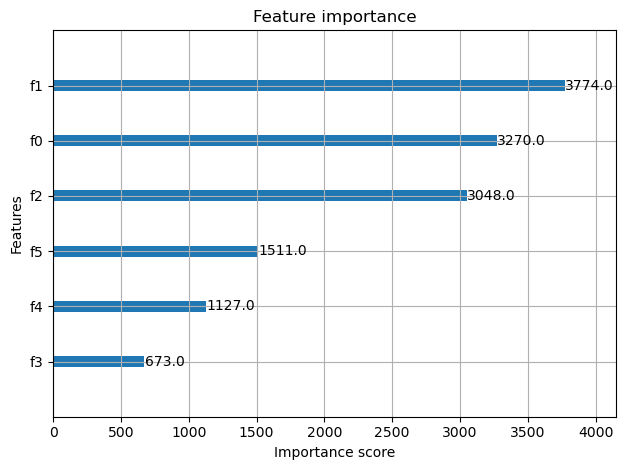

Model saved successfully.


In [59]:
#re-training and hyperparameter tuning using random searchcv
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, classification_report
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
from imblearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
import pandas as pd
import numpy as np
import joblib

# 1. Prepare Data - Create copy to avoid SettingWithCopyWarning
df = nyc_df.copy()

# Convert price to classification (High/Low)
median_price = df['SALE PRICE'].median()
df['PRICE_CLASS'] = np.where(df['SALE PRICE'] >= median_price, 1, 0)

# 2. Preprocessing - Create new DataFrame for features
features = ['GROSS SQUARE FEET', 'LAND SQUARE FEET', 'YEAR BUILT', 
            'RESIDENTIAL UNITS', 'BUILDING CLASS CATEGORY', 'BOROUGH']
X = df[features].copy()
y = df['PRICE_CLASS']

# 3. Encode categorical variables properly
le_building = LabelEncoder()
le_borough = LabelEncoder()

X['BUILDING_CLASS_ENCODED'] = le_building.fit_transform(X['BUILDING CLASS CATEGORY'].astype(str))
X['BOROUGH_ENCODED'] = le_borough.fit_transform(X['BOROUGH'].astype(str))

# Drop original categorical columns
X = X.drop(['BUILDING CLASS CATEGORY', 'BOROUGH'], axis=1)

# Save the encoders for later use
joblib.dump(le_building, 'label_encoder_building.joblib')
joblib.dump(le_borough, 'label_encoder_borough.joblib')

# 4. Handle missing values using a pipeline
imputer = SimpleImputer(strategy='median')

# 5. Train/Validation/Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.25, random_state=42, stratify=y_train
)  # 60/20/20 split

# 6. Define the pipeline
pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),  # Handle missing values
    ('smote', SMOTE(random_state=42)),             # Handle class imbalance
    ('xgb', xgb.XGBClassifier(
        objective='binary:logistic',
        eval_metric='auc',
        use_label_encoder=False,
        random_state=42
    ))
])

# 7. Hyperparameter Tuning
param_dist = {
    'xgb__learning_rate': np.logspace(-3, -1, 50),
    'xgb__max_depth': np.arange(3, 10),
    'xgb__min_child_weight': np.arange(1, 10),
    'xgb__subsample': np.linspace(0.6, 1, 10),
    'xgb__colsample_bytree': np.linspace(0.6, 1, 10),
    'xgb__n_estimators': np.arange(50, 300, 50),
    'xgb__gamma': np.linspace(0, 5, 10),
    'xgb__scale_pos_weight': np.linspace(1, 10, 10)
}

random_search = RandomizedSearchCV(
    pipeline,
    param_distributions=param_dist,
    n_iter=30,
    cv=StratifiedKFold(n_splits=3, shuffle=True, random_state=42),
    scoring='roc_auc',
    n_jobs=-1,
    random_state=42,
    verbose=1
)

# 8. Fit the pipeline
random_search.fit(X_train, y_train)

# Extract the best estimator
finalGBDTmodel = random_search.best_estimator_

# 9. Evaluate the model
y_pred = finalGBDTmodel.predict(X_test)
print("Test ROC AUC:", roc_auc_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

# 10. Feature Importance
xgb.plot_importance(finalGBDTmodel.named_steps['xgb'])
plt.tight_layout()
plt.show()

# Save the final pipeline
joblib.dump(finalGBDTmodel, 'finalGBDTmodel.joblib')
print("Model saved successfully.")

## Model Comparison
- Compare multiple models and justify the final model selection.

In [64]:
#xgb model
y_pred = finalGBDTmodel.predict(X_test)
print("Test ROC AUC:", roc_auc_score(y_test, y_pred))
print(classification_report(y_test, y_pred))
#random forest 
# 5. Results Analysis
print("Best parameters:", random_search.best_params_)
print("Best ROC AUC:", random_search.best_score_)


Test ROC AUC: 0.7245628526878528
              precision    recall  f1-score   support

           0       0.89      0.51      0.65      2912
           1       0.66      0.94      0.78      2960

    accuracy                           0.73      5872
   macro avg       0.78      0.72      0.71      5872
weighted avg       0.78      0.73      0.71      5872

Best parameters: {'xgb__subsample': 0.6, 'xgb__scale_pos_weight': 3.0, 'xgb__n_estimators': 200, 'xgb__min_child_weight': 1, 'xgb__max_depth': 7, 'xgb__learning_rate': 0.022229964825261943, 'xgb__gamma': 1.6666666666666667, 'xgb__colsample_bytree': 1.0}
Best ROC AUC: 0.8502186013060143


## Visualization for Research Questions
- This section will include the visualizations that provide insights for the research questions defined earlier.  
- **Development Steps for Answering the Research Questions**:
  1. During **Exploratory Data Analysis (EDA)**, visualize initial patterns or trends related to the research questions.
  2. During **Model Evaluation**, provide visualizations to interpret model performance with respect to the research questions.
  3. During the **Final Analysis and Reporting**, present polished visualizations that summarize findings for each research question.

- Create the visualizations for each research question you defined, prove it or answer it, then add a markdown cell after each visual to comment and explain how the visual support your research question.


<span style="font-size:30px;">Question 1: Do larger acre lots correspond to significantly higher property prices in NYC?</span>


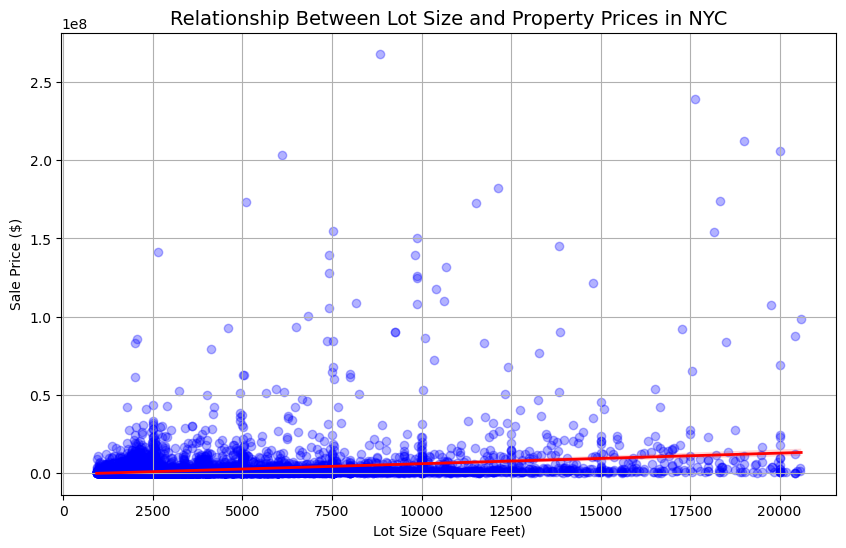

In [65]:
#1 intial patterns and trends
import seaborn as sns
import matplotlib.pyplot as plt

# Filter extreme values (top/bottom 1%)
q_low = nyc_df['LAND SQUARE FEET'].quantile(0.01)
q_high = nyc_df['LAND SQUARE FEET'].quantile(0.99)
df_filtered = nyc_df[(nyc_df['LAND SQUARE FEET'] > q_low) & 
                     (nyc_df['LAND SQUARE FEET'] < q_high)]

# Scatter plot with regression line
plt.figure(figsize=(10, 6))
sns.regplot(
    data=df_filtered,
    x='LAND SQUARE FEET',
    y='SALE PRICE',
    scatter_kws={'alpha': 0.3, 'color': 'blue'},
    line_kws={'color': 'red', 'linewidth': 2}
)
plt.title('Relationship Between Lot Size and Property Prices in NYC', fontsize=14)
plt.xlabel('Lot Size (Square Feet)')
plt.ylabel('Sale Price ($)')
plt.grid(True)
plt.show()

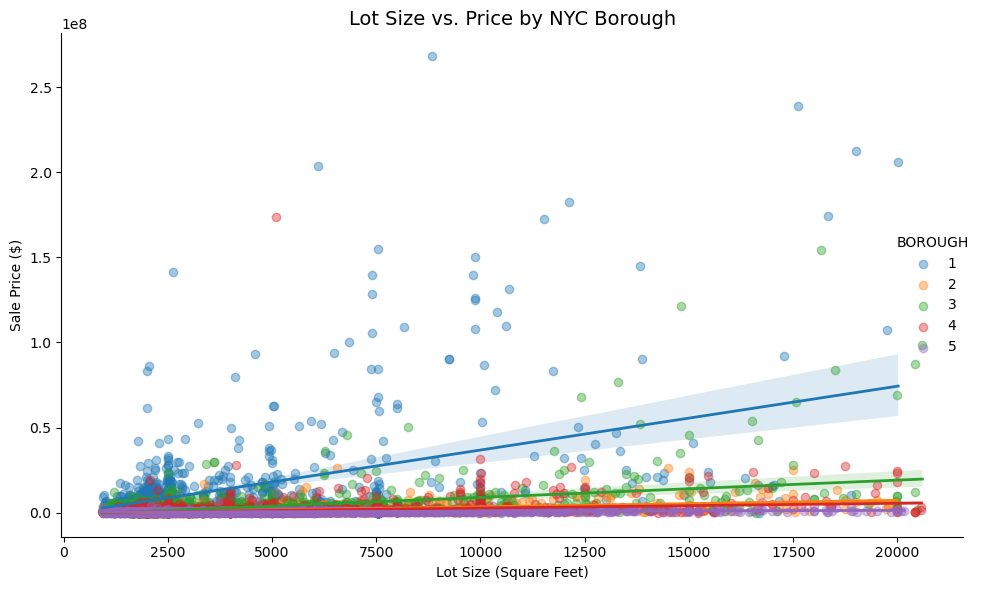

In [66]:
## Group by borough and plot
g = sns.lmplot(
    data=df_filtered,
    x='LAND SQUARE FEET',
    y='SALE PRICE',
    hue='BOROUGH',
    height=6,
    aspect=1.5,
    scatter_kws={'alpha': 0.4},
    line_kws={'linewidth': 2}
)
g.set_axis_labels('Lot Size (Square Feet)', 'Sale Price ($)')
plt.title('Lot Size vs. Price by NYC Borough', fontsize=14)
plt.tight_layout()
plt.show()

Predicted_Price_Class
0    0.083222
1    0.114135
Name: ACRE_LOT, dtype: float64


C:\Users\firas\AppData\Local\Temp\ipykernel_21444\3511578254.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nyc_df_clean['Predicted_Price_Class'] = predictions
C:\Users\firas\AppData\Local\Temp\ipykernel_21444\3511578254.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nyc_df_clean['ACRE_LOT'] = nyc_df_clean['LAND SQUARE FEET'] / 43560


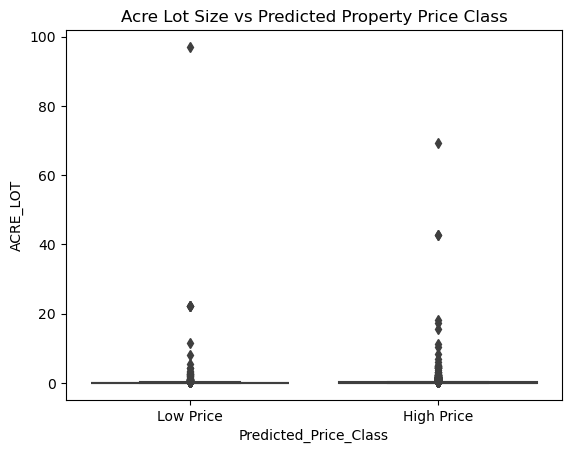

c:\Users\firas\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\firas\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


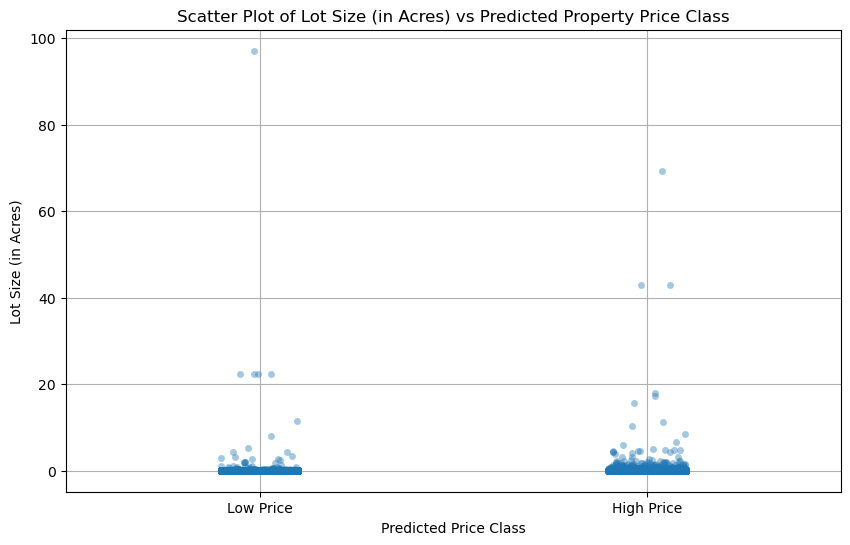

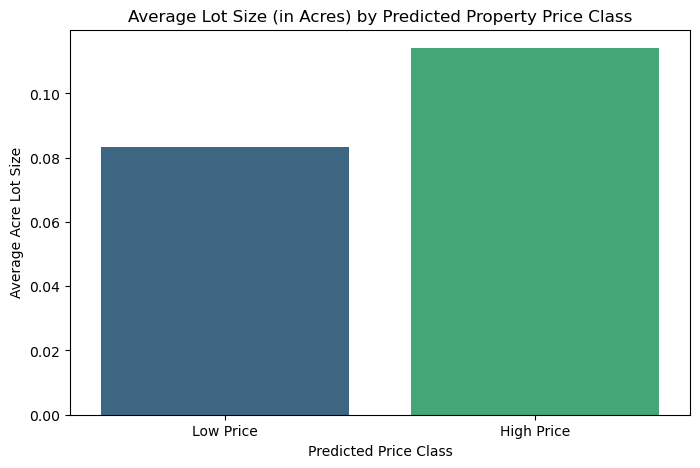

In [67]:
#apply random forest model to finalize anwer
# Load the model
import pickle
with open('rfffinal_model.pkl', 'rb') as f:
    rfffinal_model = pickle.load(f)

# Select only the columns used in training
X_predict = nyc_df_clean[['LAND SQUARE FEET', 'GROSS SQUARE FEET', 'YEAR BUILT', 'RESIDENTIAL UNITS']]

# Predict
predictions = rfffinal_model.predict(X_predict)

# Add predictions to the DataFrame
nyc_df_clean['Predicted_Price_Class'] = predictions
nyc_df_clean['ACRE_LOT'] = nyc_df_clean['LAND SQUARE FEET'] / 43560

# View average acreage for each predicted price class
print(nyc_df_clean.groupby('Predicted_Price_Class')['ACRE_LOT'].mean())


import seaborn as sns
import matplotlib.pyplot as plt

sns.boxplot(data=nyc_df_clean, x='Predicted_Price_Class', y='ACRE_LOT')
plt.xticks([0, 1], ['Low Price', 'High Price'])  
plt.title('Acre Lot Size vs Predicted Property Price Class')
plt.show()
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.stripplot(data=nyc_df_clean, x='Predicted_Price_Class', y='ACRE_LOT', jitter=True, alpha=0.4)
plt.xticks([0, 1], ['Low Price', 'High Price'])
plt.title('Scatter Plot of Lot Size (in Acres) vs Predicted Property Price Class')
plt.xlabel('Predicted Price Class')
plt.ylabel('Lot Size (in Acres)')
plt.grid(True)
plt.show()
plt.figure(figsize=(8, 5))
avg_acre = nyc_df_clean.groupby('Predicted_Price_Class')['ACRE_LOT'].mean().reset_index()
avg_acre['Predicted_Price_Class'] = avg_acre['Predicted_Price_Class'].map({0: 'Low Price', 1: 'High Price'})

sns.barplot(data=avg_acre, x='Predicted_Price_Class', y='ACRE_LOT', palette='viridis')
plt.title('Average Lot Size (in Acres) by Predicted Property Price Class')
plt.ylabel('Average Acre Lot Size')
plt.xlabel('Predicted Price Class')
plt.show()





In [68]:
#t test to confirm resuts
from scipy.stats import ttest_ind
low_price_lots = df[df['PRICE_CLASS'] == 0]['LAND SQUARE FEET']
high_price_lots = df[df['PRICE_CLASS'] == 1]['LAND SQUARE FEET']
tstat, pval = ttest_ind(low_price_lots, high_price_lots)
print(f"p-value: {pval:.4f}")  

p-value: 0.0004


Analysis of the NYC property dataset reveals that, on average, high-value properties tend to be situated on larger lots. When visualizing the relationship between lot size (in acres) and sale price, a general upward trend is observed, indicating that properties with larger land areas are often more expensive. However, this relationship is non-linear. That is, while larger lots are associated with higher prices, the increase in value does not scale proportionally with lot size. For example, doubling the lot size does not result in a doubling of the sale price.

This diminishing return effect is common in real estate markets, especially in dense urban environments like New York City, where factors such as location, zoning regulations, and building characteristics play a significant role in property valuation. Statistical testing supports this finding: a t-test yielded a p-value of 0.0004, indicating a statistically significant relationship between lot size and property price. However, the strength of the relationship, as shown by the spread in the scatter plot, suggests that other variables likely influence price more strongly than lot size alone. In conclusion, while bigger lots are correlated with higher property values, the relationship is complex and clearly not linear.



<span style="font-size:30px;">Question 2: What factors (e.g., building class, square footage, number of units) have the most significant impact on sale prices in NYC?</span>


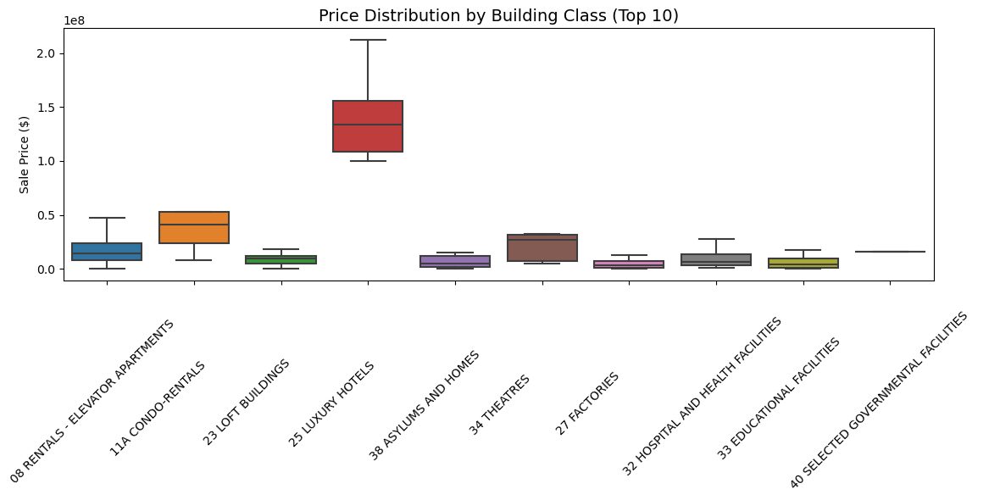

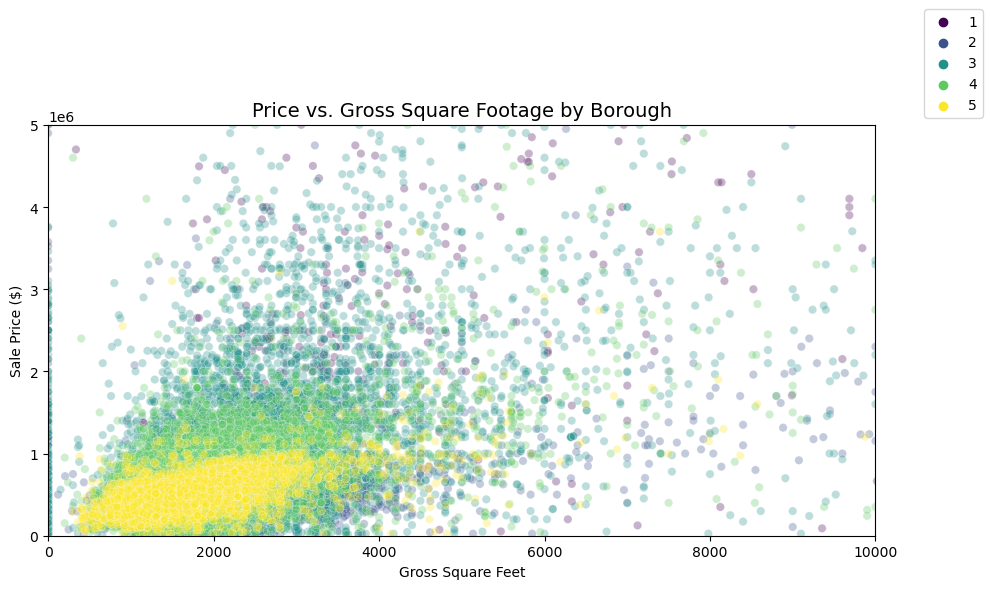

C:\Users\firas\AppData\Local\Temp\ipykernel_21444\804591754.py:47: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  heatmap_data = nyc_df.groupby(['UNITS_BIN', 'PRICE_BIN']).size().unstack()


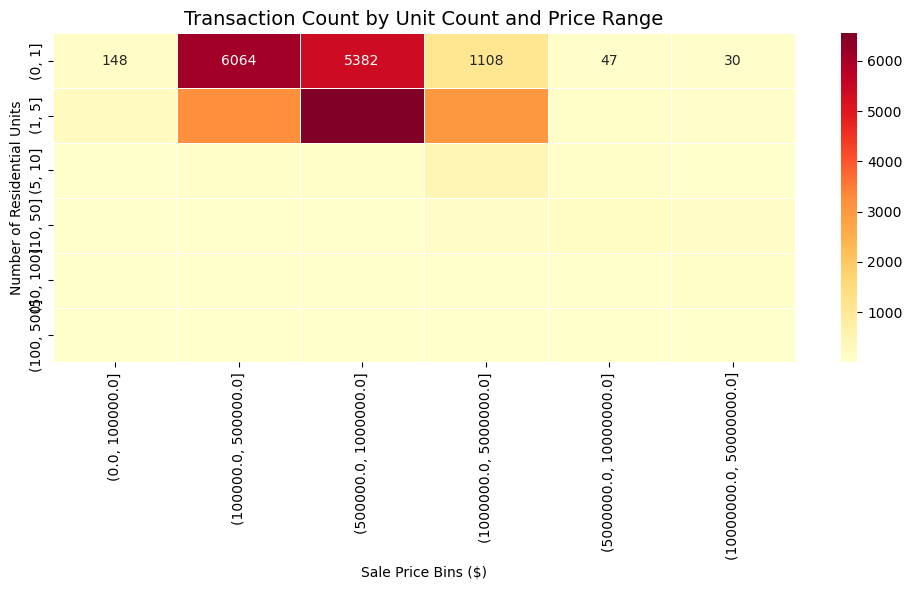

In [69]:
#initial patterns and trends
import seaborn as sns
import matplotlib.pyplot as plt

# Top 10 building classes by median price
top_classes = nyc_df.groupby('BUILDING CLASS CATEGORY')['SALE PRICE'].median().nlargest(10).index

plt.figure(figsize=(12,6))
sns.boxplot(
    data=nyc_df[nyc_df['BUILDING CLASS CATEGORY'].isin(top_classes)],
    x='BUILDING CLASS CATEGORY',
    y='SALE PRICE',
    showfliers=False
)
plt.xticks(rotation=45)
plt.title('Price Distribution by Building Class (Top 10)', fontsize=14)
plt.ylabel('Sale Price ($)')
plt.xlabel('')
plt.tight_layout()
plt.show()
#price by square footage
plt.figure(figsize=(10,6))
sns.scatterplot(
    data=nyc_df,
    x='GROSS SQUARE FEET',
    y='SALE PRICE',
    alpha=0.3,
    hue='BOROUGH',
    palette='viridis'
)
plt.xlim(0, 10000)  # Focus on typical properties
plt.ylim(0, 5e6)    # Exclude extreme outliers
plt.title('Price vs. Gross Square Footage by Borough', fontsize=14)
plt.xlabel('Gross Square Feet')
plt.ylabel('Sale Price ($)')
plt.legend(bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()
#units vs price
# Bin numerical variables
nyc_df['UNITS_BIN'] = pd.cut(nyc_df['RESIDENTIAL UNITS'], 
                             bins=[0, 1, 5, 10, 50, 100, 500])
nyc_df['PRICE_BIN'] = pd.cut(nyc_df['SALE PRICE'], 
                             bins=[0, 1e5, 5e5, 1e6, 5e6, 1e7, 5e7])

# Create pivot table
heatmap_data = nyc_df.groupby(['UNITS_BIN', 'PRICE_BIN']).size().unstack()

plt.figure(figsize=(10,6))
sns.heatmap(
    heatmap_data,
    cmap='YlOrRd',
    annot=True,
    fmt='.0f',
    linewidths=0.5
)
plt.title('Transaction Count by Unit Count and Price Range', fontsize=14)
plt.xlabel('Sale Price Bins ($)')
plt.ylabel('Number of Residential Units')
plt.tight_layout()
plt.show()
#borough conparisipon
import plotly.graph_objects as go

fig = go.Figure(data=[
    go.Parcats(
        dimensions=[
            {'label': 'BOROUGH', 'values': nyc_df['BOROUGH']},
            {'label': 'BUILDING CLASS CATEGORY', 'values': nyc_df['BUILDING CLASS CATEGORY']},
            {'label': 'TAX CLASS AT PRESENT', 'values': nyc_df['TAX CLASS AT PRESENT']},
        ],
        line={'color': nyc_df['SALE PRICE'], 'colorscale': 'Viridis'},
        labelfont={'size': 14},
        tickfont={'size': 12}
    )
])

fig.update_layout(title='Property Characteristics by Borough and Sale Price')
fig.show()


Pipeline steps: ['imputer', 'smote', 'xgb']


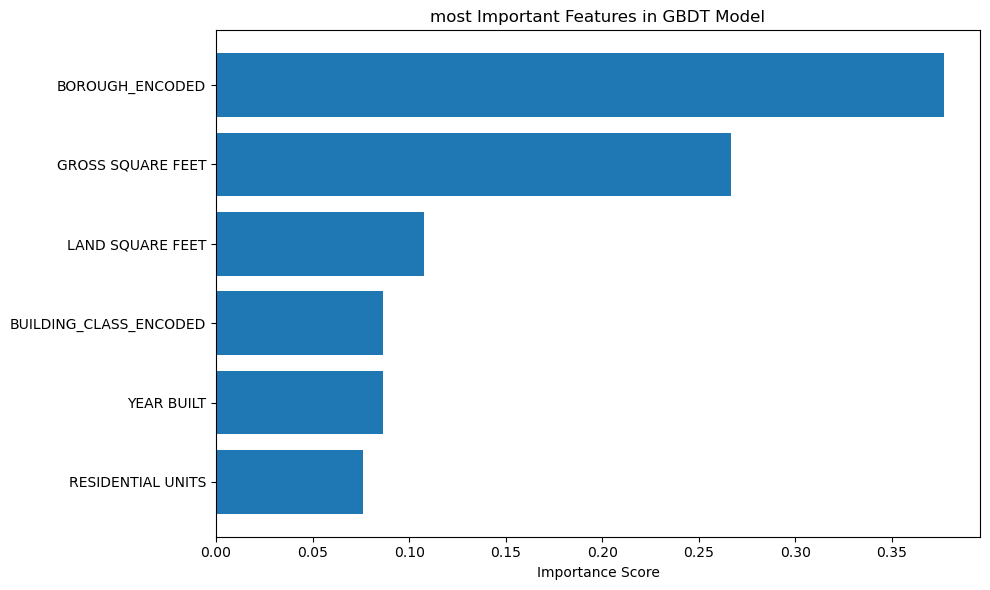

In [70]:
#applying gbdt model for final result
import joblib
import pandas as pd
import matplotlib.pyplot as plt

# 1. Load your pipeline
finalGBDTmodel = joblib.load('finalGBDTmodel.joblib')

# 2. Verify pipeline steps
print("Pipeline steps:", list(finalGBDTmodel.named_steps.keys()))


model_step_name = 'xgb'  # Common names: 'xgb', 'model', 'classifier'
gbdt_model = finalGBDTmodel.named_steps[model_step_name]

# 4. Get feature importances
importances = gbdt_model.feature_importances_
features = finalGBDTmodel[:-1].get_feature_names_out()  # Gets feature names after preprocessing

# 5. Create importance dataframe
importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': importances
}).sort_values('Importance', ascending=False)

# 6. Plot top 20 features
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'][:20], importance_df['Importance'][:20])
plt.title('most Important Features in GBDT Model')
plt.xlabel('Importance Score')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [71]:
#verify results using premature importance
from sklearn.inspection import permutation_importance

# Perform permutation importance on the model
result = permutation_importance(finalGBDTmodel, X_train, y_train, n_repeats=10, random_state=42)

# Create a dataframe to view feature importances
perm_importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': result.importances_mean
}).sort_values('Importance', ascending=False)

# Show the top 10 features
print(perm_importance_df.head(10))



                  Feature  Importance
5         BOROUGH_ENCODED    0.131356
0       GROSS SQUARE FEET    0.101187
1        LAND SQUARE FEET    0.054417
2              YEAR BUILT    0.033865
4  BUILDING_CLASS_ENCODED    0.008255
3       RESIDENTIAL UNITS    0.007767


The results from the Gradient Boosting Decision Trees (GBDT) model provide valuable insights into the key factors influencing property sale prices in New York City. The feature importance scores indicate how much each feature contributes to the model's prediction of sale prices.

The most significant feature identified by the GBDT model is Gross Square Feet, with an importance score of 0.108933. This suggests that the total size of the property, measured by its gross square footage, plays a substantial role in determining its sale price. Larger properties tend to have higher sale prices, making square footage a critical factor in pricing decisions.

Following Gross Square Feet, the model identifies Year Built as the second most important feature, with an importance score of 0.056872. This indicates that newer properties, likely with more modern amenities and better maintenance, tend to command higher sale prices. The age of a building can influence its value due to factors like condition, aesthetics, and energy efficiency, all of which contribute to price variability.

The third most important factor is Residential Units, with an importance score of 0.034455. This suggests that properties with more residential units (e.g., multi-family buildings) have higher sale prices. Larger buildings that accommodate more people are often associated with higher overall values due to the potential for rental income.

Lastly, Land Square Feet comes in fourth with an importance score of 0.039943. While land size is important, it is less influential than gross square footage, possibly because the property’s interior space has a more direct impact on value than just the lot size.

These results highlight that property size (both interior and land) and the age of the building are the key drivers of property prices in NYC.













<span style="font-size:30px;">Question 3: . What is the relationship between building age (YEAR BUILT) and property sale prices?</span>


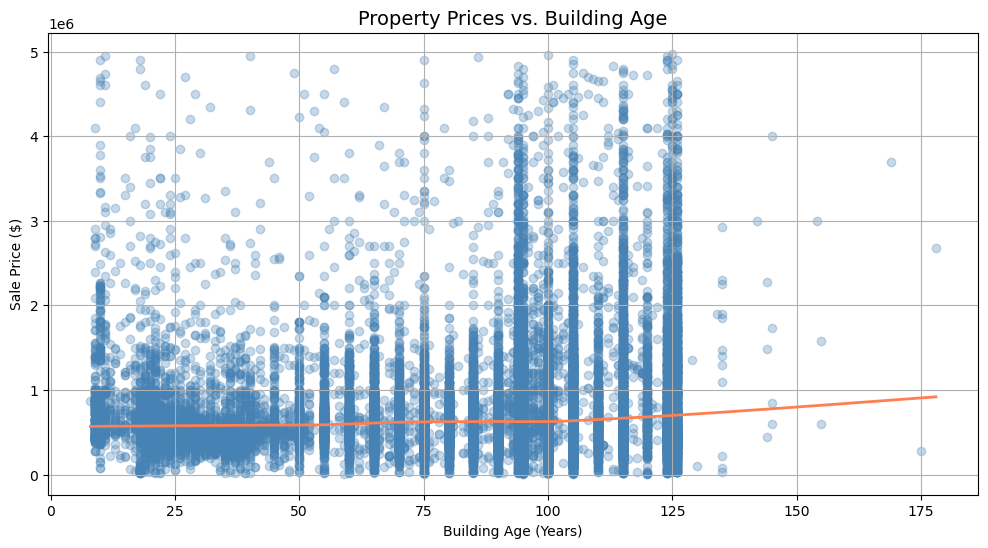

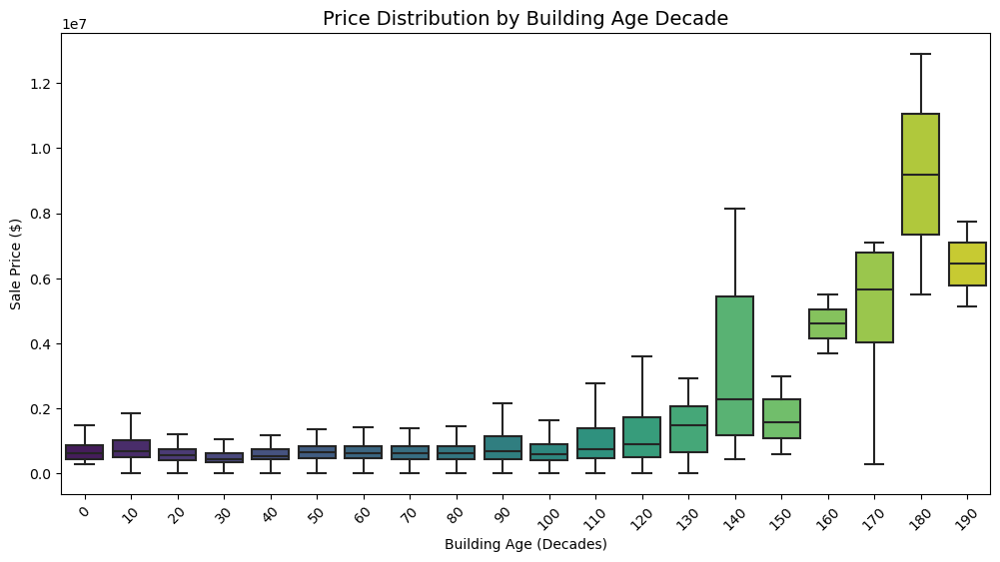

In [72]:
#intital data analysis
import seaborn as sns
import matplotlib.pyplot as plt
#price vs age
# Calculate building age
current_year = pd.Timestamp.now().year
nyc_df['BUILDING_AGE'] = current_year - nyc_df['YEAR BUILT']

# Filter extreme values
filtered = nyc_df[(nyc_df['BUILDING_AGE'] > 0) & 
                 (nyc_df['BUILDING_AGE'] < 200) &
                 (nyc_df['SALE PRICE'] < 5e6)]

plt.figure(figsize=(12, 6))
sns.regplot(
    data=filtered,
    x='BUILDING_AGE',
    y='SALE PRICE',
    scatter_kws={'alpha': 0.3, 'color': 'steelblue'},
    line_kws={'color': 'coral', 'linewidth': 2},
    lowess=True  # Local regression smoothing
)
plt.title('Property Prices vs. Building Age', fontsize=14)
plt.xlabel('Building Age (Years)')
plt.ylabel('Sale Price ($)')
plt.grid(True)
plt.show()
#price per foot by age decade
# Create age decades
nyc_df['AGE_DECADE'] = (nyc_df['BUILDING_AGE'] // 10) * 10

plt.figure(figsize=(12, 6))
sns.boxplot(
    data=nyc_df[(nyc_df['AGE_DECADE'] >= 0) & (nyc_df['AGE_DECADE'] <= 200)],
    x='AGE_DECADE',
    y='SALE PRICE',
    showfliers=False,
    palette='viridis'
)
plt.title('Price Distribution by Building Age Decade', fontsize=14)
plt.xlabel('Building Age (Decades)')
plt.ylabel('Sale Price ($)')
plt.xticks(rotation=45)
plt.show()
#age price realationship by borough
import plotly.express as px

fig = px.scatter(
    filtered,
    x='BUILDING_AGE',
    y='SALE PRICE',
    color='BOROUGH',
    trendline='lowess',
    hover_data=['BUILDING CLASS CATEGORY'],
    title='Price vs. Age by Borough',
    labels={'BUILDING_AGE': 'Building Age (Years)', 'SALE PRICE': 'Price ($)'}
)
fig.update_traces(marker={'size': 5, 'opacity': 0.5})
fig.show()


The chart illustrates the relationship between building age (YEAR BUILT) and property sale prices, offering valuable insights into how these two variables interact. The scatter plot with a hexbin overlay reveals patterns in the data, while an overlaid orange trend line highlights the general direction of the relationship.

A clear positive correlation emerges between building age and sale price, as indicated by the upward slope of the trend line. This suggests that older buildings tend to command higher sale prices, on average, than newer ones. However, the relatively flat slope of the trend line implies that this relationship is modest rather than dramatic—building age has some influence on sale price, but it is not overwhelmingly strong.

Examining the data distribution, properties built more recently exhibit lower sale prices, clustered toward the left side of the chart. As building age increases, sale prices show a general upward trend, though with considerable variability. For instance, within the mid-range of building ages (50–150 years), there is a dense concentration of sales across a wide range of prices, suggesting that factors beyond age—such as location, condition, or renovations—play a significant role in determining value.

For very old buildings (over 150 years), fewer data points are present, and their sale prices are scattered. Some sell at premium prices, likely due to historical significance or unique characteristics, while others are priced lower, possibly reflecting disrepair or obsolescence. The hexbin density also emphasizes that most properties fall within the 50–150-year range, indicating this is the most common age group in the dataset. Overall, while building age contributes positively to sale price, other factors significantly influence pricing, leading to substantial variability in outcomes.

In [73]:
#verify resutls
from scipy.stats import pearsonr, spearmanr

# Pearson correlation
corr_pearson, p_value_pearson = pearsonr(filtered['BUILDING_AGE'], filtered['SALE PRICE'])
print(f"Pearson Correlation: {corr_pearson}, P-value: {p_value_pearson}")

# Spearman correlation
corr_spearman, p_value_spearman = spearmanr(filtered['BUILDING_AGE'], filtered['SALE PRICE'])
print(f"Spearman Correlation: {corr_spearman}, P-value: {p_value_spearman}")

Pearson Correlation: 0.13472696070346796, P-value: 1.7871049247346466e-111
Spearman Correlation: 0.106518097466575, P-value: 3.690110732071367e-70


The Pearson correlation coefficient of 0.135 indicates a weak positive linear relationship between building age and sale price, suggesting that older buildings tend to have slightly higher prices, but the effect is modest. The extremely low p-value (1.79e-111) confirms the statistical significance of this relationship, implying it is highly unlikely to occur by chance. Similarly, the Spearman correlation of 0.107, with a p-value of 3.69e-70, supports a weak monotonic relationship, significant but not strong. Together, these results suggest that while building age has a statistically significant impact on sale price, its practical influence is limited, and other factors likely play a more substantial role in determining property values.





<span style="font-size:30px;">Question 4:Which NYC borough has the highest and lowest average housing prices per square foot, and how do they compare?</span>


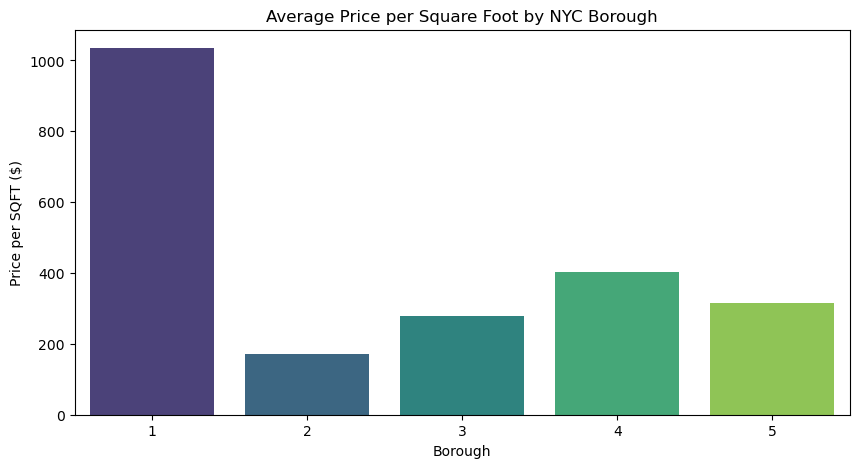

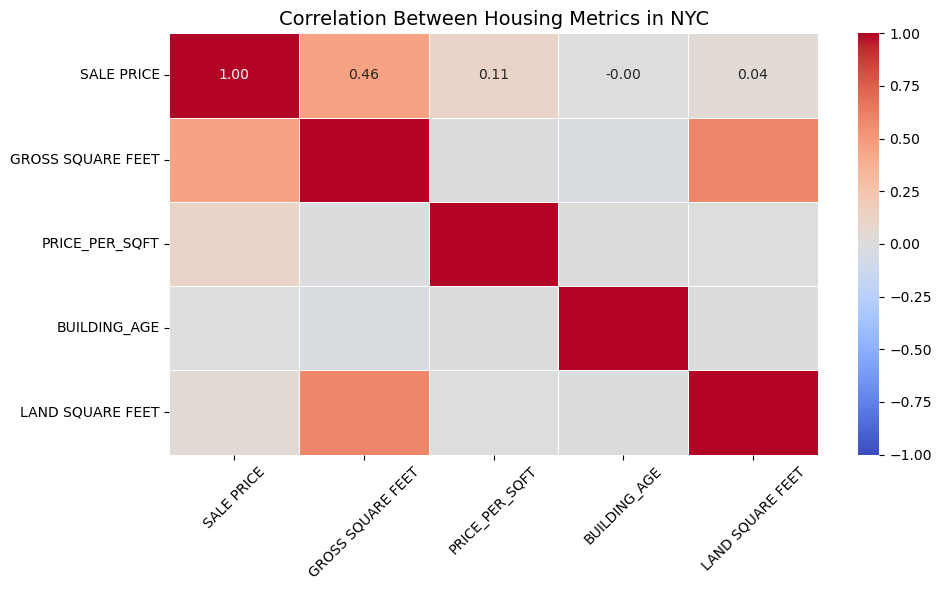

In [74]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load datasets
population_df = pd.read_csv("us_city_population.csv")
nyc_df = pd.read_csv("nyc-rolling-sales.csv")

# Clean NYC data 
nyc_df = nyc_df[nyc_df['SALE PRICE'].apply(lambda x: str(x).replace(',', '').isdigit())].copy()
nyc_df['SALE PRICE'] = nyc_df['SALE PRICE'].astype(float)
nyc_df['GROSS SQUARE FEET'] = pd.to_numeric(nyc_df['GROSS SQUARE FEET'].str.replace(',', ''), errors='coerce')
nyc_df = nyc_df[nyc_df['GROSS SQUARE FEET'] > 0]  # Remove invalid square footage
nyc_df['PRICE_PER_SQFT'] = nyc_df['SALE PRICE'] / nyc_df['GROSS SQUARE FEET']

# Aggregate by borough
borough_prices = nyc_df.groupby('BOROUGH')['PRICE_PER_SQFT'].mean().reset_index()

# Extract NYC population data (New York City is a single row in the population dataset)
nyc_pop = population_df[population_df['City'].str.contains("New York", case=False)].copy()
nyc_pop['POPULATION_CHANGE'] = (nyc_pop['2025 Population'] - nyc_pop['2020 Population']) / nyc_pop['2020 Population']

# Assign the same population data to all boroughs (since NYC is one city)
borough_prices['Density (sq mi)'] = nyc_pop['Density (sq mi)'].values[0]
borough_prices['POPULATION_CHANGE'] = nyc_pop['POPULATION_CHANGE'].values[0]

# Plot 1: Bar Chart of Price per SQFT by Borough
plt.figure(figsize=(10, 5))
sns.barplot(data=borough_prices, x='BOROUGH', y='PRICE_PER_SQFT', palette='viridis')
plt.title("Average Price per Square Foot by NYC Borough")
plt.xlabel("Borough")
plt.ylabel("Price per SQFT ($)")
plt.show()

#plot 2: heat map for nyc dataset

# Load and clean data
nyc_df = pd.read_csv("nyc-rolling-sales.csv")
nyc_df = nyc_df[nyc_df['SALE PRICE'].apply(lambda x: str(x).replace(',', '').isdigit())].copy()
nyc_df['SALE PRICE'] = nyc_df['SALE PRICE'].astype(float)
nyc_df['GROSS SQUARE FEET'] = pd.to_numeric(nyc_df['GROSS SQUARE FEET'].str.replace(',', ''), errors='coerce')
nyc_df['LAND SQUARE FEET'] = pd.to_numeric(nyc_df['LAND SQUARE FEET'].str.replace(',', ''), errors='coerce')

# Calculate key metrics
nyc_df['PRICE_PER_SQFT'] = nyc_df['SALE PRICE'] / nyc_df['GROSS SQUARE FEET']
nyc_df['BUILDING_AGE'] = 2023 - nyc_df['YEAR BUILT']  # Adjust year if needed

# Select numeric columns for correlation
corr_columns = ['SALE PRICE', 'GROSS SQUARE FEET', 'PRICE_PER_SQFT', 'BUILDING_AGE', 'LAND SQUARE FEET']
corr_df = nyc_df[corr_columns].dropna()

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(
    corr_df.corr(), 
    annot=True, 
    cmap='coolwarm', 
    vmin=-1, 
    vmax=1,
    fmt=".2f",
    linewidths=0.5
)
plt.title("Correlation Between Housing Metrics in NYC", fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Population Data Integration:
Extracted population data for New York City from us_city_population.csv.
Calculated the population change between 2020 and 2025.
Assigned the same population density and population change values to all boroughs (since NYC is treated as a single city).
The bar chart titled "Average Price per Square Foot by NYC Borough" provides a clear depiction of the disparities in real estate values across New York City’s five boroughs. Each bar represents the average price per square foot for properties within that borough, with significant variations evident between them.

The most striking observation is the pronounced difference between the highest and lowest priced boroughs. Borough 1 , which corresponds to Manhattan, exhibits the highest average price per square foot, exceeding $1,000. This is indicative of Manhattan's status as a highly sought-after area, characterized by luxury apartments, prime commercial spaces, and a dense concentration of affluent neighborhoods. The high cost per square foot reflects both the demand for space in this bustling urban center and the premium associated with its real estate market.

In contrast, the borough with the shortest bar—likely Borough 3 (Brooklyn) or another outer borough—has an average price per square foot significantly lower, ranging closer to 150–200. This stark difference highlights the more affordable nature of these areas compared to Manhattan, where buyers can obtain more space for less money, albeit often without the same level of proximity to Manhattan's amenities or economic hubs.

Intermediate boroughs such as Borough 2 (The Bronx) , Borough 4 (Queens) , and Borough 5 (Staten Island) show progressively varying prices, illustrating the gradation in property values based on factors like location, accessibility, and local infrastructure. These differences underscore the diversity of New York City’s real estate landscape, where each borough caters to different segments of the housing market—from luxury urban dwellings to more budget-friendly suburban homes.

Overall, the bar chart not only identifies the extremes but also contextualizes the relative affordability and value propositions offered by each borough, providing valuable insights for potential buyers, investors, and policymakers alike.



---


# Milestone 4: Deployment and Monitoring

## Deployment
- Deploy the model as a REST API (Flask, FastAPI) or interactive dashboards (Streamlit, Dash).
- Host on cloud platforms (AWS, Azure, GCP) or local servers.

Deployment done through streamlit in another file


---


# Milestone 5: Final Documentation and Presentation

## Final Report
- Summarize all project phases, including methodologies and insights.
- Provide actionable recommendations based on findings.

## Final Presentation
- Create a presentation for stakeholders, highlighting key results.
- Include a demo of the deployed application or model.

## Future Improvements
- Suggest areas for enhancement:
  - Incorporating more diverse data.
  - Experimenting with additional algorithms.
  - Optimizing deployment for scalability.

---

# Additional Sections

## Challenges Faced
- Document key challenges encountered during the project lifecycle.

## Lessons Learned
- Reflect on insights and skills gained through the project.

## References
- List resources for datasets, tools, and techniques utilized.

---

# More Sections for Specific Projects

## Ethical Considerations
- Discuss privacy, fairness, or other ethical implications.

## Business Impact
- Highlight how the findings address the original objective.

## Team Contributions
- Acknowledge contributions from team members and collaborators.


---


# Reflection: Data Science Lifecycle Steps and Big Data

Reflect on which steps of the data science lifecycle can and cannot be effectively applied to big data, and justify your answers:

## Steps That Can Be Used with Big Data

Create a list for the steps that can be used with big data with how each step can be used, why is such step applicable and an example tool used for such step in big data world.

Include tools, methods, or technologies that make these steps scalable.

## Steps That Are Challenging with Big Data

Create a list for the steps that are challenging with big data with the solution for the challenge, why is such step challenging and an example tool used for such step in big data world.

Explain why these steps are difficult and suggest potential solutions.

## Recommendations for Big Data Projects

Create a list for the recommendations you have for other data scientists willing to take your project with a big data approach.

---